# Initial Setup

Initial import statements

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from keras.datasets import mnist
from keras.datasets import fashion_mnist
from sklearn import datasets

import torchvision.transforms as transforms

from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow

np.random.seed(0)
torch.manual_seed(0)
torch.use_deterministic_algorithms(False)

Use GPU accelerator instead of running all computations on the CPU

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


Use a Dataset as a wrapper for the training set data

In [ ]:
class MyDataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform
        
    def __getitem__(self, index):
        x = self.data[index]
        if self.transform:
            x = self.transform(x)
        return x
    
    def __len__(self):
        return len(self.data)

# Wasserstein Discriminator

Make several discriminator models, depending on what size images we input

In [ ]:
class Discriminator28x28(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(784, 1000)
        self.lin2 = nn.Linear(1000, 500)
        self.lin3 = nn.Linear(500, 200)
        self.lin4 = nn.Linear(200, 1)

        self.dropout = nn.Dropout(p=0.3)

        self.leakyrelu = nn.LeakyReLU(0.2)


    def forward(self, x):
        x = x.reshape(-1, 784)
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin4(x)
        return x

In [ ]:
class Discriminator64x64(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(4096, 5000)
        self.lin2 = nn.Linear(5000, 1000)
        self.lin3 = nn.Linear(1000, 500)
        self.lin4 = nn.Linear(500, 1)

        self.dropout = nn.Dropout(p=0.3)

        self.leakyrelu = nn.LeakyReLU(0.2)


    def forward(self, x):
        x = x.reshape(-1, 4096)
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin4(x)
        return x

In [ ]:
class Discriminator62x47(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(2914, 5000)
        self.lin2 = nn.Linear(5000, 10000)
        self.lin3 = nn.Linear(10000, 5000)
        self.lin4 = nn.Linear(5000, 1000)
        self.lin5 = nn.Linear(1000, 500)
        self.lin6 = nn.Linear(500, 100)
        self.lin7 = nn.Linear(100, 1)

        self.dropout = nn.Dropout(p=0.3)

        self.leakyrelu = nn.LeakyReLU(0.2)


    def forward(self, x):
        x = x.reshape(-1, 2914)
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin4(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin5(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin6(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin7(x)
        return x

# Wasserstein Generator

Make several generator models, depending on what size images we input

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(100, 200)
        self.lin2 = nn.Linear(200, 400)
        self.lin3 = nn.Linear(400, 800)
        self.lin4 = nn.Linear(800, 784)

        self.leakyrelu = nn.LeakyReLU(0.2)

        self.tanh = nn.Tanh()

    def forward(self, x):
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.lin4(x)
        x = self.tanh(x)
        x = x.reshape(-1, 1, 28, 28)
        return x

In [ ]:
class Generator64x64(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(100, 250)
        self.lin2 = nn.Linear(250, 500)
        self.lin3 = nn.Linear(500, 1000)
        self.lin4 = nn.Linear(1000, 4096)

        self.leakyrelu = nn.LeakyReLU(0.2)

        self.tanh = nn.Tanh()

    def forward(self, x):
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.lin4(x)
        x = self.tanh(x)
        x = x.reshape(-1, 1, 64, 64)
        return x

In [ ]:
class Generator62x47(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(100, 250)
        self.lin2 = nn.Linear(250, 500)
        self.lin3 = nn.Linear(500, 1000)
        self.lin4 = nn.Linear(1000, 5000)
        self.lin5 = nn.Linear(5000, 2500)
        self.lin6 = nn.Linear(2500, 2914)

        self.leakyrelu = nn.LeakyReLU(0.2)

        self.tanh = nn.Tanh()

    def forward(self, x):
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.lin4(x)
        x = self.leakyrelu(x)
        x = self.lin5(x)
        x = self.leakyrelu(x)
        x = self.lin6(x)
        x = self.tanh(x)
        x = x.reshape(-1, 1, 62, 47)
        return x

# Joint Train and Evaluate Functions

In [ ]:
def train(disc, gen, X_train_loader, dim, epochs):
    optimizer_disc = optim.RMSprop(disc.parameters(), lr=0.0002)
    optimizer_gen = optim.RMSprop(gen.parameters(), lr=0.0002)
    BATCH_SIZE = 10

    for epoch in range(epochs):
        print("Epoch " + str(epoch))
        for batch_idx, X_batch in enumerate(X_train_loader):
            # train discriminator on real data
            disc.train()
            gen.eval()
            optimizer_disc.zero_grad()
            var_X_batch_true = Variable(X_batch).float().to(device)
            output_true = disc(var_X_batch_true)
            loss_true = -torch.mean(output_true)
            loss_true.backward()
            optimizer_disc.step()

            # train discriminator on fake data
            for _ in range(3):
                noise = Variable(torch.rand(BATCH_SIZE, 100)).to(device)
                gen_output = gen(noise).detach()
                output_fake = disc(gen_output)
                loss_false_disc = torch.mean(output_fake)
                loss_false_disc.backward()
                optimizer_disc.step()

            # train generator less often than discriminator
            if batch_idx % 5 == 0:
                BATCH_SIZE = 10
                disc.eval()
                gen.train()
                optimizer_gen.zero_grad()
                noise = Variable(torch.rand(BATCH_SIZE, 100)).to(device)
                gen_output = gen(noise)
                output_fake = disc(gen_output)
                loss_false_gen = -torch.mean(output_fake)
                loss_false_gen.backward()
                optimizer_gen.step()

            # ensure that model parameters don't grow too large
            for p in disc.parameters():
                p.data.clamp_(-0.01, 0.01)

            for p in gen.parameters():
                p.data.clamp_(-0.1, 0.1)

            # print out sample generated image
            if batch_idx % 100 == 0:
                gen.eval()
                pic = gen(Variable(torch.randn(100)).to(device))
                if dim == '28x28':
                    imshow(np.asarray(pic[0][0].detach().cpu().numpy()), cmap='Greys', vmin=-1, vmax=1)
                else:
                    imshow(np.asarray(pic[0][0].detach().cpu().numpy()), cmap=plt.cm.bone, vmin=-1, vmax=1)
                plt.show()

In [ ]:
def evaluate_disc(disc, gen, X_test_loader):
    disc.eval()
    gen.eval()
    with torch.no_grad():
        correct_real = 0
        total = 0
        for batch_idx, X_batch in enumerate(X_test_loader):
            var_X_batch_true = Variable(X_batch).float().to(device)
            output_true = disc(var_X_batch_true)
            pred_real = torch.sign(output_true)
            correct_real += int(torch.sum(pred_real==1))
            total += 10

            if batch_idx == 1:
                print(output_true.cpu().numpy())
                print(pred_real.cpu().numpy())

        print()
        
        correct_fake = 0
        for i in range(10000):
            torch.manual_seed(i)
            X_fake = gen(torch.rand(100).to(device))
            pred_fake = torch.sign(disc(X_fake))
            correct_fake += (1 if (pred_fake==-1) else 0)

        for i in range(10):
            torch.manual_seed(i)
            X_fake = gen(torch.rand(100).to(device))
            print(disc(X_fake).cpu().numpy())
            print(torch.sign(disc(X_fake)).cpu().numpy())
        print()
        print()

        print("Real Percentage Correct: " + str(100 * correct_real / total) + "%")
        print("Fake Percentage Correct: " + str(100 * correct_fake / 10000) + "%")

In [ ]:
def evaluate_gen(gen, dim):
    with torch.no_grad():
        gen.eval()
        for i in range(10):
            torch.manual_seed(i)
            fake = gen(torch.rand(100).to(device))
            if dim == '28x28':
                imshow(np.asarray(fake[0][0].detach().cpu().numpy()), cmap='Greys', vmin=-1, vmax=1)
            else:
                imshow(np.asarray(fake[0][0].detach().cpu().numpy()), cmap=plt.cm.bone, vmin=-1, vmax=1)
            plt.show()

# MNIST GAN

## Procure MNIST Dataset

11493376/11490434 [==============================] - 0s 0us/step
X_train: (60000, 28, 28)
X_test:  (10000, 28, 28)


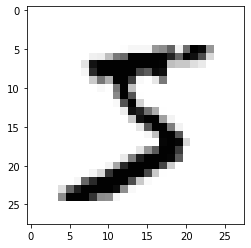

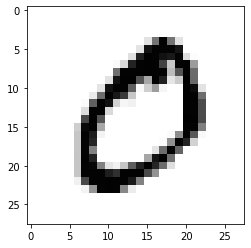

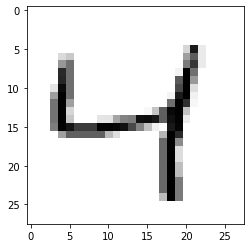

In [ ]:
(X_train_mnist, _), (X_test_mnist, _) = mnist.load_data()
X_train_mnist = np.copy(X_train_mnist)
X_test_mnist = np.copy(X_test_mnist)
print('X_train: ' + str(X_train_mnist.shape))
print('X_test:  '  + str(X_test_mnist.shape))

for i in range(3):
  imshow(np.asarray(X_train_mnist[i]), cmap='Greys', vmin=0, vmax=255)
  plt.show()

Show average image as baseline reference

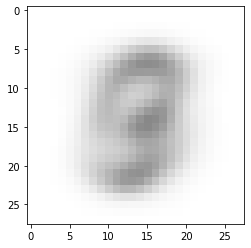

In [ ]:
average_mnist = np.sum(X_train_mnist, axis=0)/X_train_mnist.shape[0]
imshow(average_mnist, cmap='Greys', vmin=0, vmax=255)
plt.show()

Turn dataset into dataloader as input to model

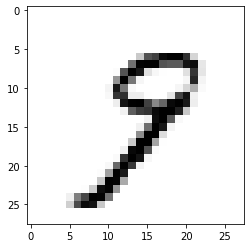

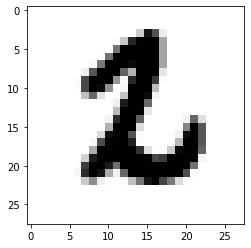

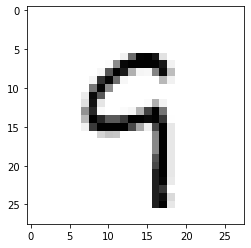

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])

train_dataset_mnist = MyDataset(X_train_mnist, transform)
train_loader_mnist = DataLoader(train_dataset_mnist, batch_size=10, shuffle=True, num_workers=2, pin_memory=torch.cuda.is_available())

test_dataset_mnist = MyDataset(X_test_mnist, transform)
test_loader_mnist = DataLoader(test_dataset_mnist, batch_size=10, shuffle=False, num_workers=2, pin_memory=torch.cuda.is_available())


for batch_idx, X_batch in enumerate(train_loader_mnist):
  if batch_idx < 3:
    pic = Variable(X_batch)
    imshow(np.asarray(pic[0][0].detach().cpu().numpy()), cmap='Greys', vmin=-1, vmax=1)
    plt.show()
  else:
    break

## Run MNIST GAN

Epoch 0


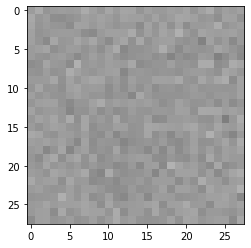

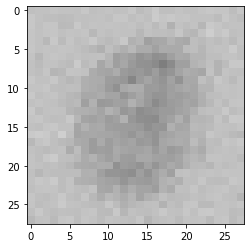

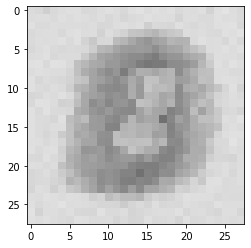

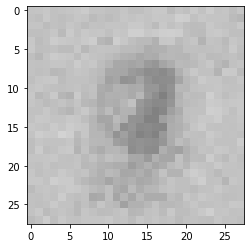

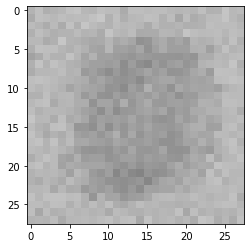

...

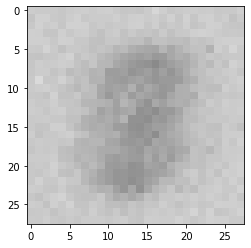

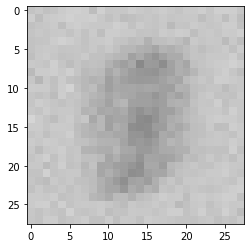

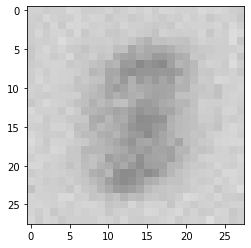

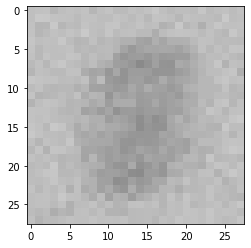

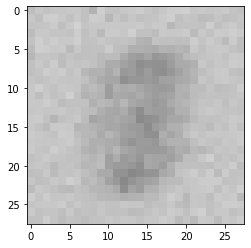

KeyboardInterrupt: ignored

In [ ]:
D_mnist = Discriminator28x28().to(device)
G_mnist = Generator().to(device)
train(D_mnist, G_mnist, train_loader_mnist, '28x28', 50)

In [ ]:
evaluate_disc(D_mnist, G_mnist, test_loader_mnist)

[[2.291518  ]
 [1.6672559 ]
 [0.58968425]
 [1.4853557 ]
 [1.5009196 ]
 [1.9648628 ]
 [1.0837924 ]
 [1.1598458 ]
 [2.26245   ]
 [0.72367567]]
[[1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]]

[[0.6897885]]
[[1.]]
[[0.82886785]]
[[1.]]
[[1.0010729]]
[[1.]]
[[0.5087587]]
[[1.]]
[[1.273816]]
[[1.]]
[[0.556636]]
[[1.]]
[[1.391974]]
[[1.]]
[[0.30409795]]
[[1.]]
[[0.69087106]]
[[1.]]
[[0.72065115]]
[[1.]]


Real Percentage Correct: 99.92%
Fake Percentage Correct: 0.0%


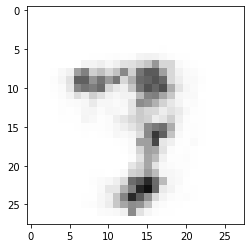

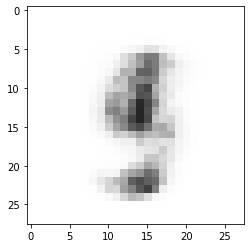

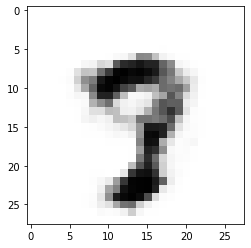

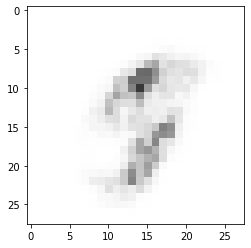

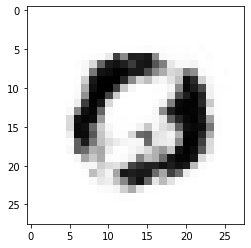

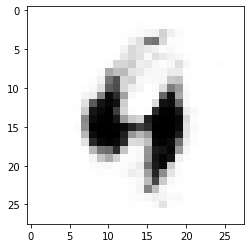

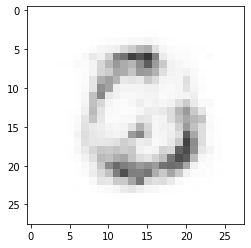

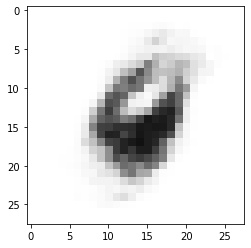

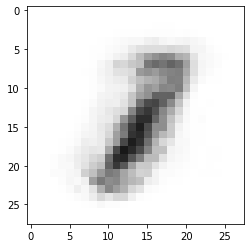

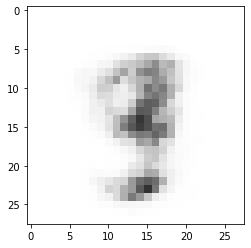

In [ ]:
evaluate_gen(G_mnist, '28x28')

# Fashion MNIST GAN

## Procure Fashion MNIST Dataset

X_train: (60000, 28, 28)
X_test:  (10000, 28, 28)


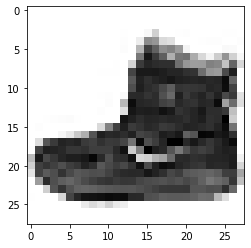

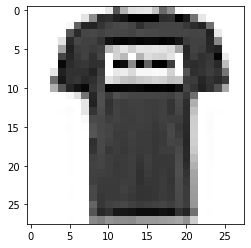

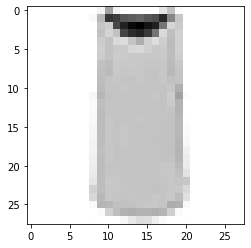

In [ ]:
(X_train_fashion_mnist, _), (X_test_fashion_mnist, _) = fashion_mnist.load_data()
X_train_fashion_mnist = np.copy(X_train_fashion_mnist)
X_test_fashion_mnist = np.copy(X_test_fashion_mnist)
print('X_train: ' + str(X_train_fashion_mnist.shape))
print('X_test:  '  + str(X_test_fashion_mnist.shape))

for i in range(3):
  imshow(np.asarray(X_train_fashion_mnist[i]), cmap='Greys', vmin=0, vmax=255)
  plt.show()

Show average image as baseline reference

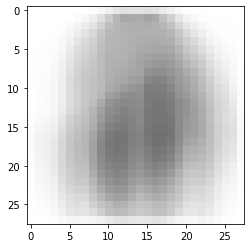

In [ ]:
average_fashion_mnist = np.sum(X_train_fashion_mnist, axis=0)/X_train_fashion_mnist.shape[0]
imshow(average_fashion_mnist, cmap='Greys', vmin=0, vmax=255)
plt.show()

Turn dataset into dataloader as input to model

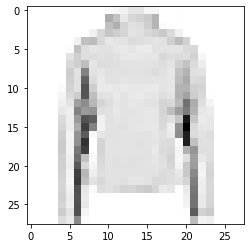

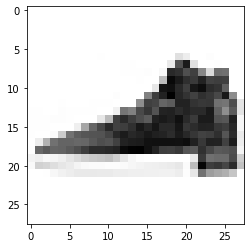

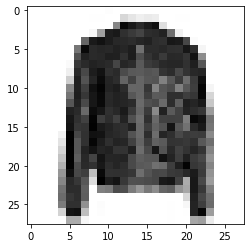

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])

train_dataset_fashion_mnist = MyDataset(X_train_fashion_mnist, transform)
train_loader_fashion_mnist = DataLoader(train_dataset_fashion_mnist, batch_size=10, shuffle=True, num_workers=2, pin_memory=torch.cuda.is_available())

test_dataset_fashion_mnist = MyDataset(X_test_fashion_mnist, transform)
test_loader_fashion_mnist = DataLoader(test_dataset_fashion_mnist, batch_size=10, shuffle=False, num_workers=2, pin_memory=torch.cuda.is_available())


for batch_idx, X_batch in enumerate(train_loader_fashion_mnist):
  if batch_idx < 3:
    pic = Variable(X_batch)
    imshow(np.asarray(pic[0][0].detach().cpu().numpy()), cmap='Greys', vmin=-1, vmax=1)
    plt.show()
  else:
    break

## Run Fashion MNIST GAN

In [ ]:
D_fashion_mnist = Discriminator28x28().to(device)
G_fashion_mnist = Generator28x28().to(device)
train(D_fashion_mnist, G_fashion_mnist, train_loader_fashion_mnist, '28x28', 50)

NameError: ignored

In [ ]:
evaluate_disc(D_fashion_mnist, G_fashion_mnist, test_loader_fashion_mnist)

[[13.983994]
 [10.803827]
 [14.262018]
 [15.256647]
 [26.117533]
 [ 8.109931]
 [13.596794]
 [20.205523]
 [20.265928]
 [30.639807]]
[[1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]]

[[14.706721]]
[[1.]]
[[21.06299]]
[[1.]]
[[14.083607]]
[[1.]]
[[23.898829]]
[[1.]]
[[12.827418]]
[[1.]]
[[15.563105]]
[[1.]]
[[11.798974]]
[[1.]]
[[11.457705]]
[[1.]]
[[20.680704]]
[[1.]]
[[16.699965]]
[[1.]]


Real Percentage Correct: 99.88%
Fake Percentage Correct: 0.0%


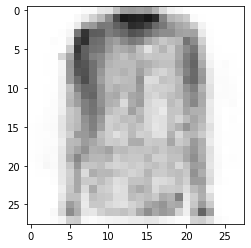

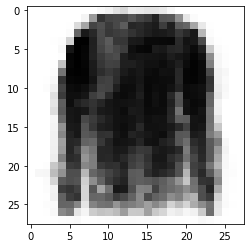

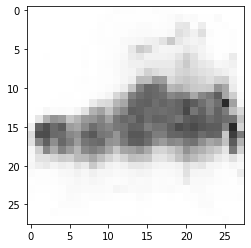

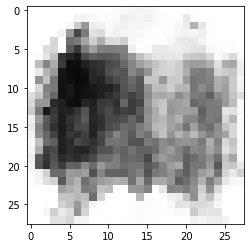

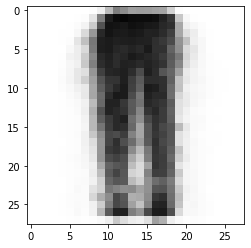

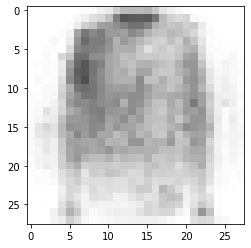

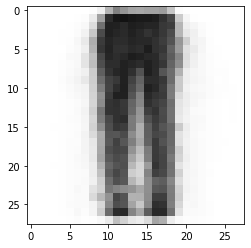

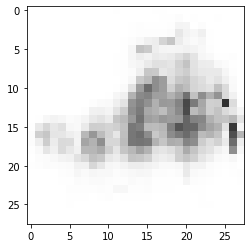

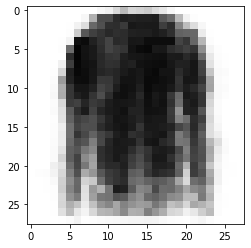

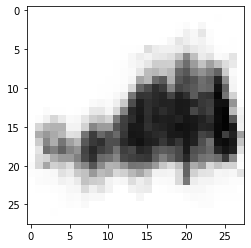

In [ ]:
evaluate_gen(G_fashion_mnist, '28x28')

# Eigenfaces GAN

## Procure Eigenfaces Dataset

(400, 64, 64)


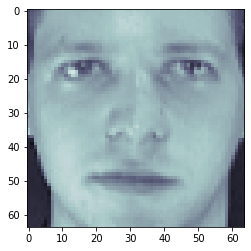

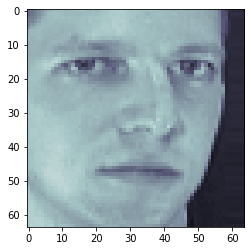

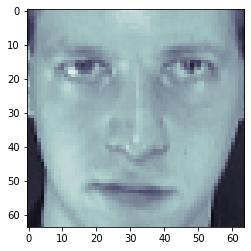

In [ ]:
X_train_eigenfaces = datasets.fetch_olivetti_faces().images
print(X_train_eigenfaces.shape)

for i in range(3):
  imshow(X_train_eigenfaces[i], cmap=plt.cm.bone, vmin=0, vmax=1)
  plt.show()

Show average image as baseline reference

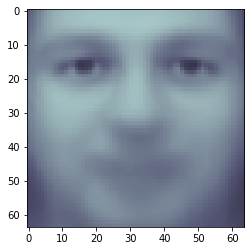

In [ ]:
average_eigenfaces = np.sum(X_train_eigenfaces, axis=0)/X_train_eigenfaces.shape[0]
imshow(average_eigenfaces, cmap=plt.cm.bone, vmin=0, vmax=1)
plt.show()

Turn dataset into dataloader as input to model

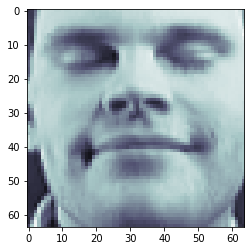

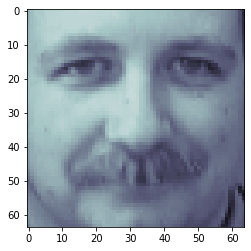

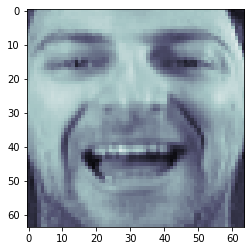

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])

train_dataset_eigenfaces = MyDataset(X_train_eigenfaces, transform)
train_loader_eigenfaces = DataLoader(train_dataset_eigenfaces, batch_size=10, shuffle=True, num_workers=2, pin_memory=torch.cuda.is_available())


for batch_idx, X_batch in enumerate(train_loader_eigenfaces):
  if batch_idx < 3:
    pic = Variable(X_batch)
    imshow(np.asarray(pic[0][0].detach().cpu().numpy()), cmap=plt.cm.bone, vmin=-1, vmax=1)
    plt.show()
  else:
    break

## Run Eigenfaces GAN

Epoch 0


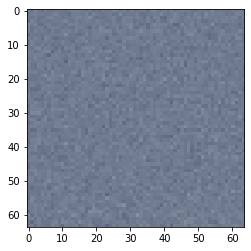

Epoch 1


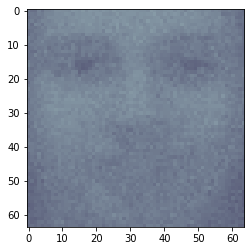

Epoch 2


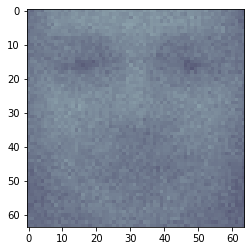

Epoch 3


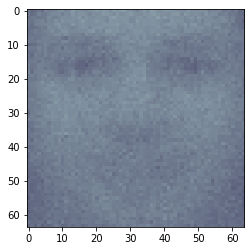

Epoch 4


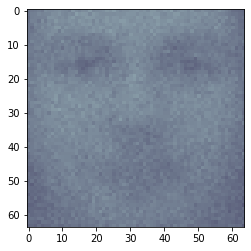

Epoch 5


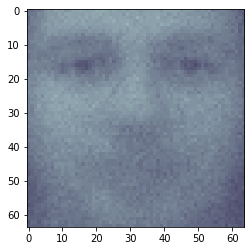

Epoch 6


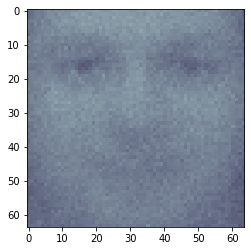

Epoch 7


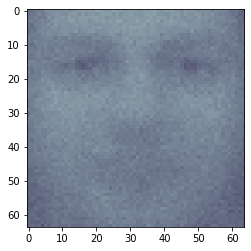

Epoch 8


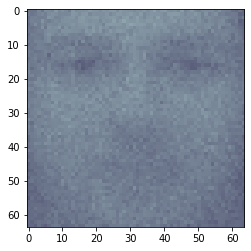

Epoch 9


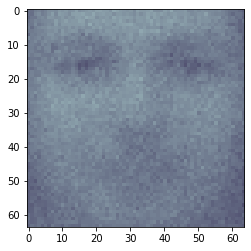

Epoch 10


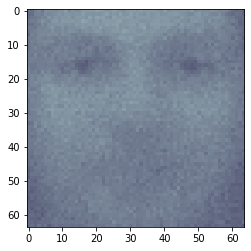

Epoch 11


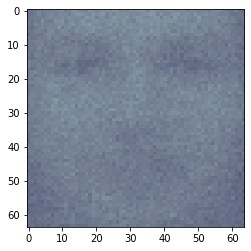

Epoch 12


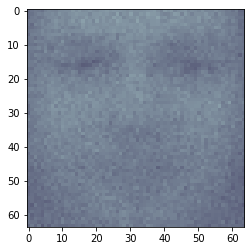

Epoch 13


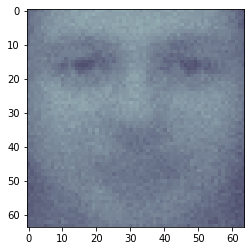

Epoch 14


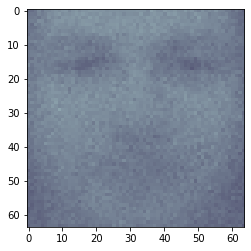

Epoch 15


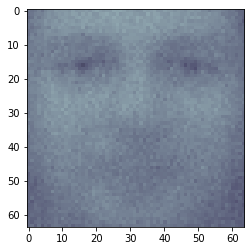

Epoch 16


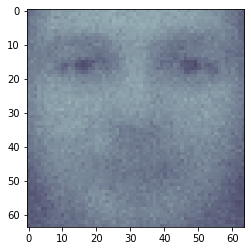

Epoch 17


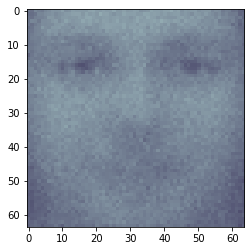

Epoch 18


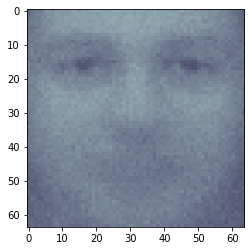

Epoch 19


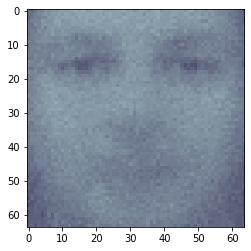

Epoch 20


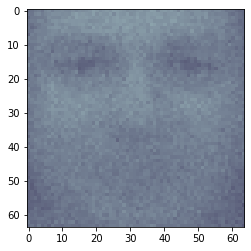

Epoch 21


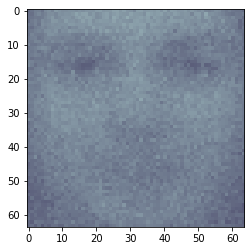

Epoch 22


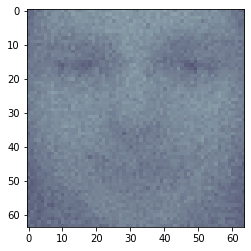

Epoch 23


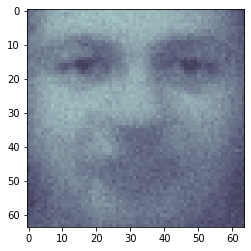

Epoch 24


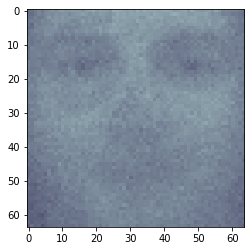

Epoch 25


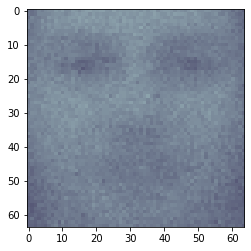

Epoch 26


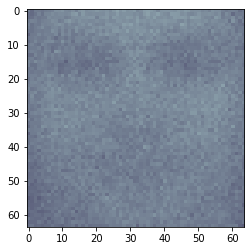

Epoch 27


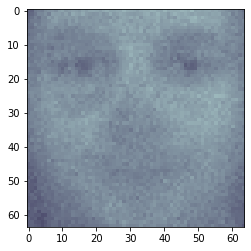

Epoch 28


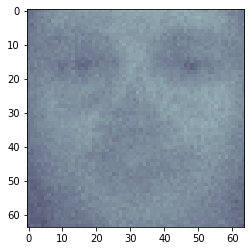

Epoch 29


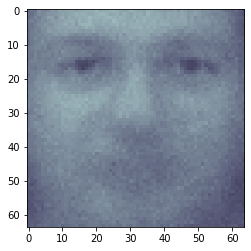

Epoch 30


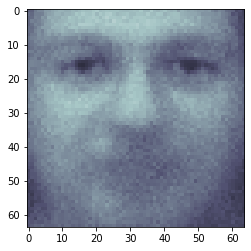

Epoch 31


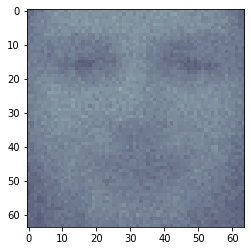

Epoch 32


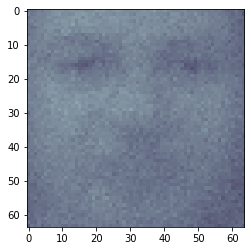

Epoch 33


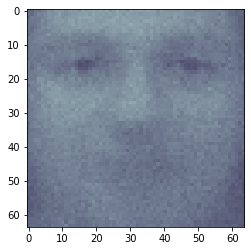

Epoch 34


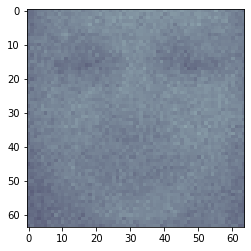

Epoch 35


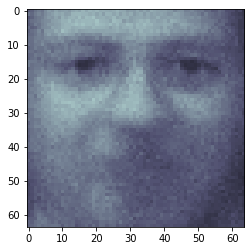

Epoch 36


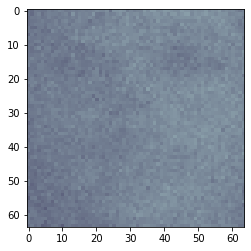

Epoch 37


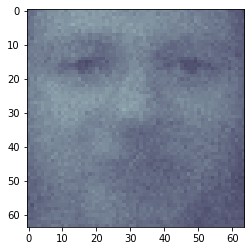

Epoch 38


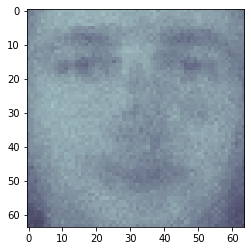

Epoch 39


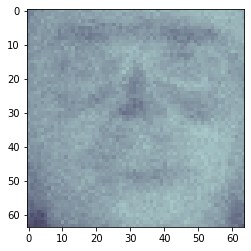

Epoch 40


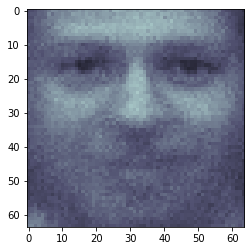

Epoch 41


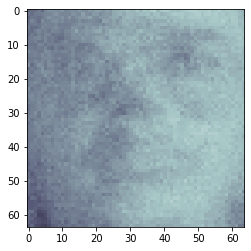

Epoch 42


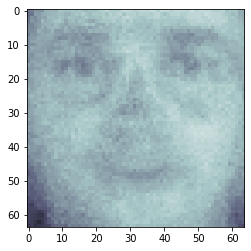

Epoch 43


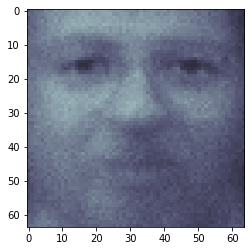

Epoch 44


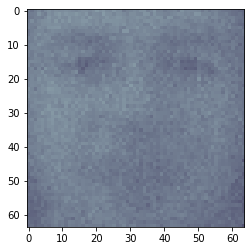

Epoch 45


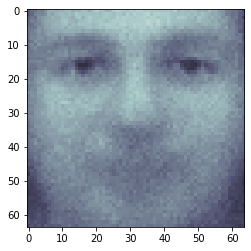

Epoch 46


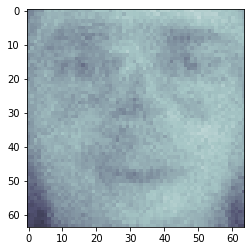

Epoch 47


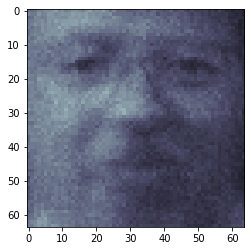

Epoch 48


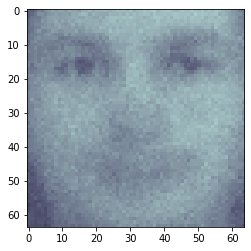

Epoch 49


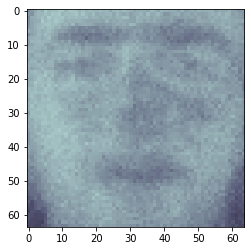

Epoch 50


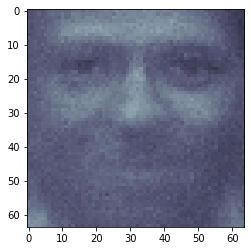

Epoch 51


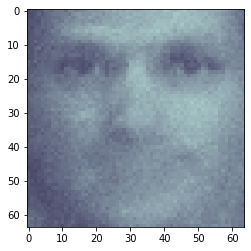

Epoch 52


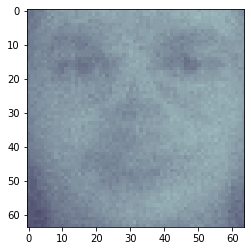

Epoch 53


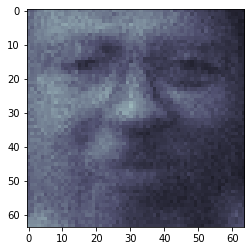

Epoch 54


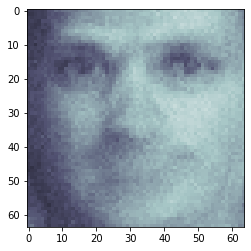

Epoch 55


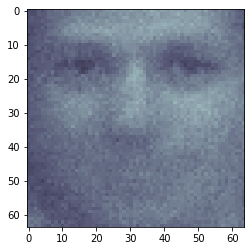

Epoch 56


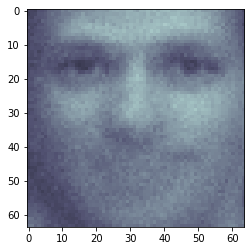

Epoch 57


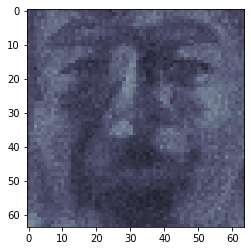

Epoch 58


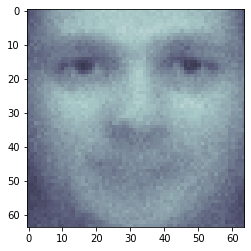

Epoch 59


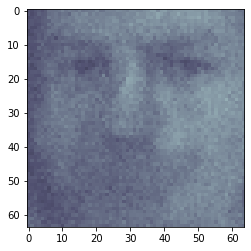

Epoch 60


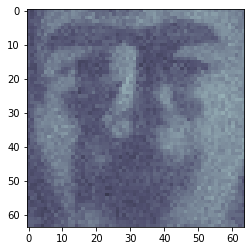

Epoch 61


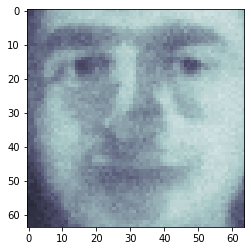

Epoch 62


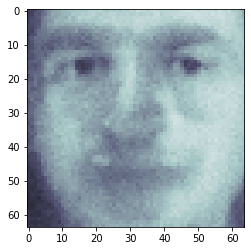

Epoch 63


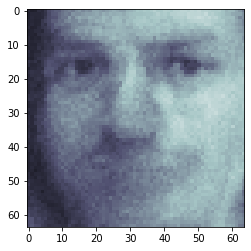

Epoch 64


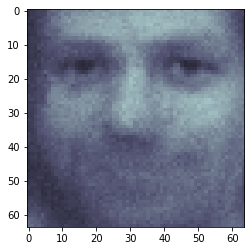

Epoch 65


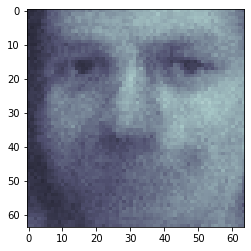

Epoch 66


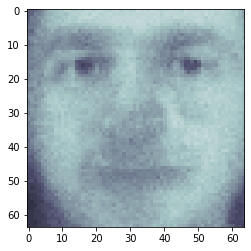

Epoch 67


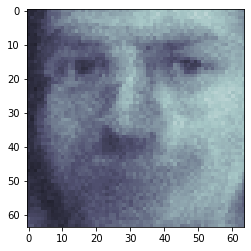

Epoch 68


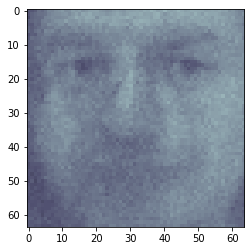

Epoch 69


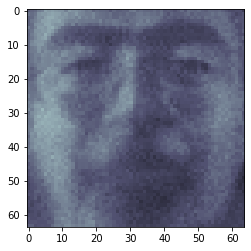

Epoch 70


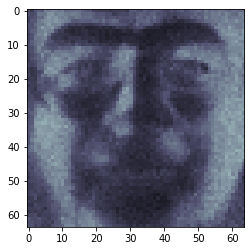

Epoch 71


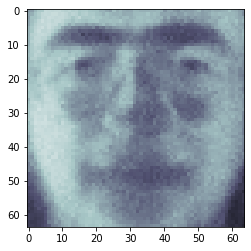

Epoch 72


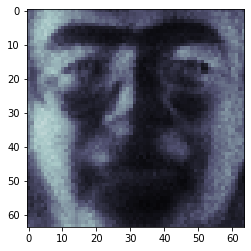

Epoch 73


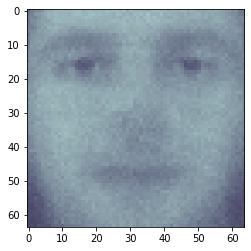

Epoch 74


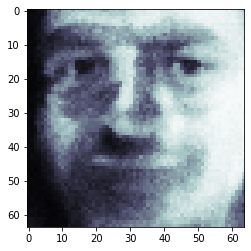

Epoch 75


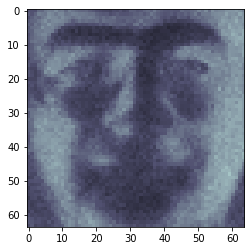

Epoch 76


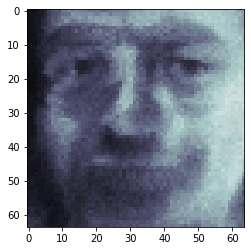

Epoch 77


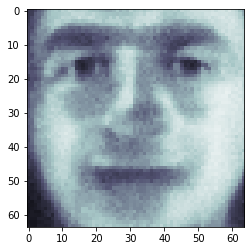

Epoch 78


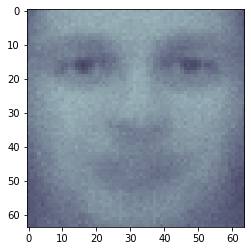

Epoch 79


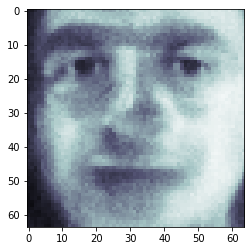

Epoch 80


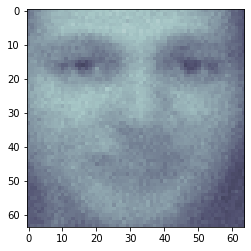

Epoch 81


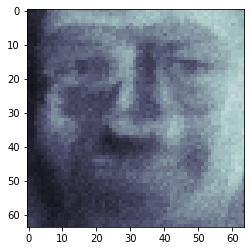

Epoch 82


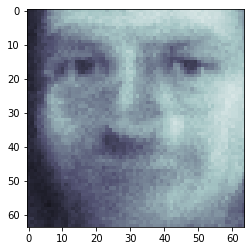

Epoch 83


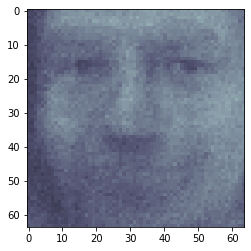

Epoch 84


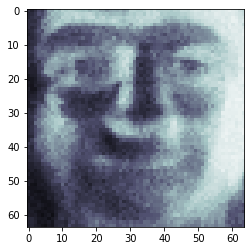

Epoch 85


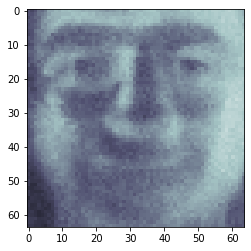

Epoch 86


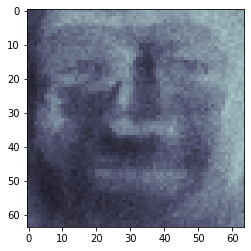

Epoch 87


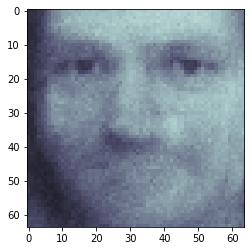

Epoch 88


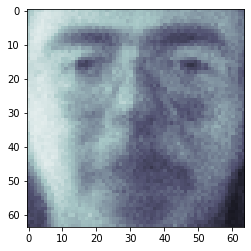

Epoch 89


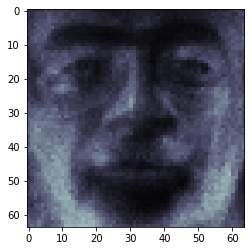

Epoch 90


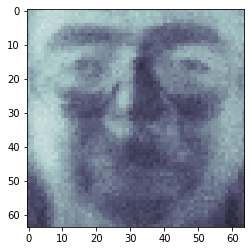

Epoch 91


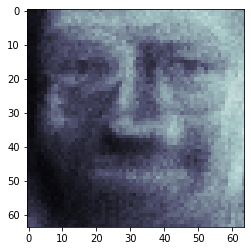

Epoch 92


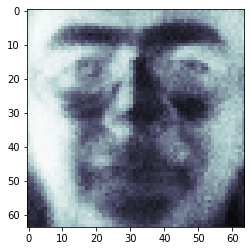

Epoch 93


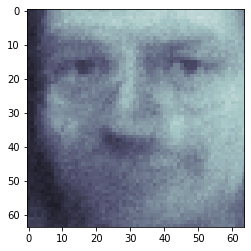

Epoch 94


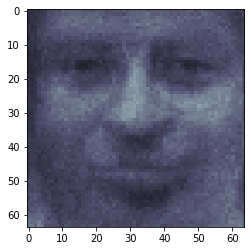

Epoch 95


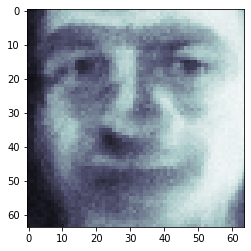

Epoch 96


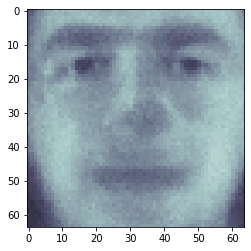

Epoch 97


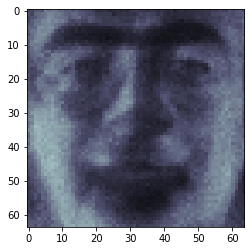

Epoch 98


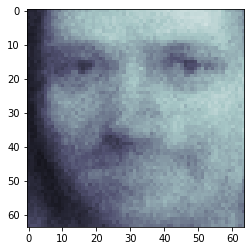

Epoch 99


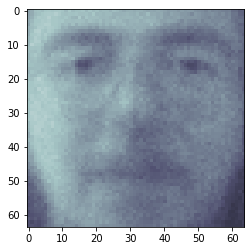

Epoch 100


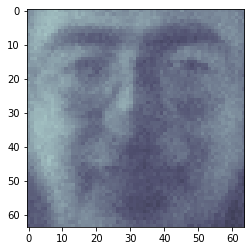

Epoch 101


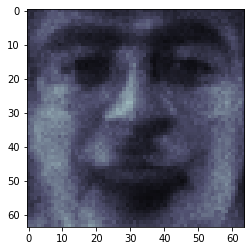

Epoch 102


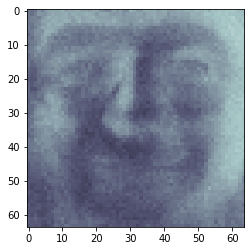

Epoch 103


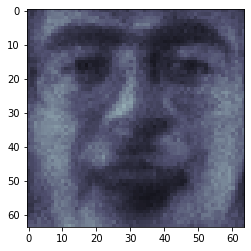

Epoch 104


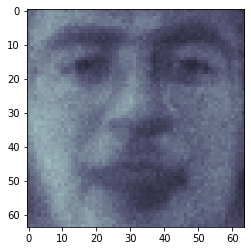

Epoch 105


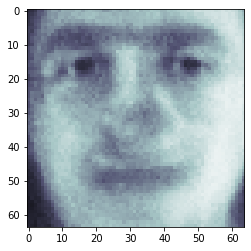

Epoch 106


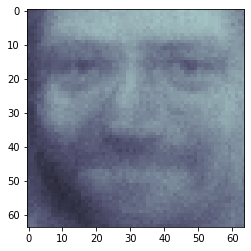

Epoch 107


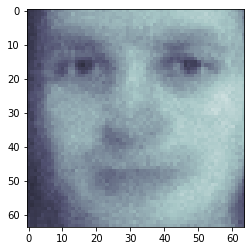

Epoch 108


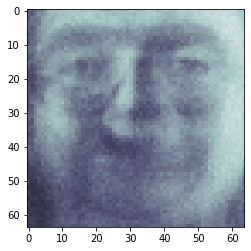

Epoch 109


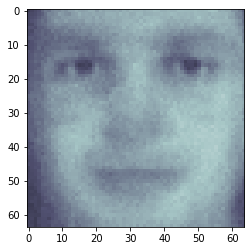

Epoch 110


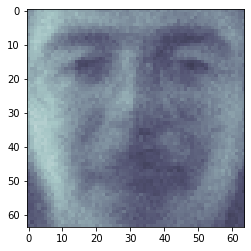

Epoch 111


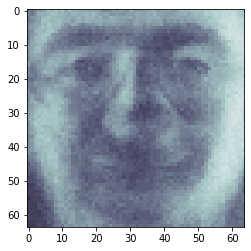

Epoch 112


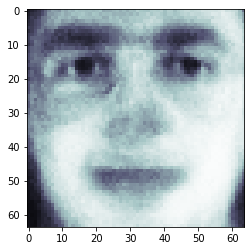

Epoch 113


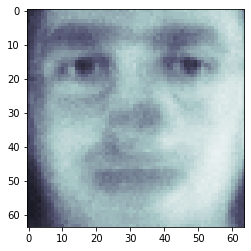

Epoch 114


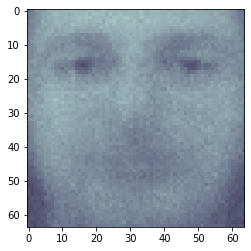

Epoch 115


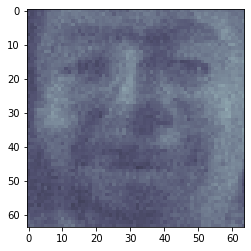

Epoch 116


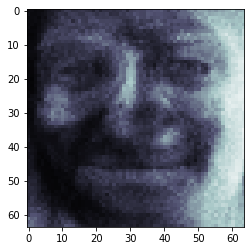

Epoch 117


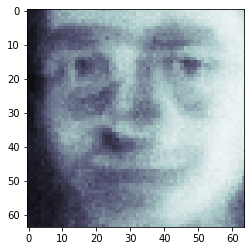

Epoch 118


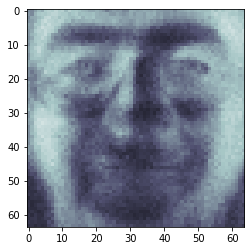

Epoch 119


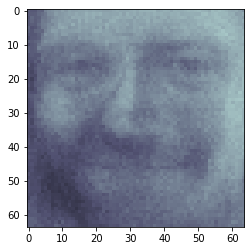

Epoch 120


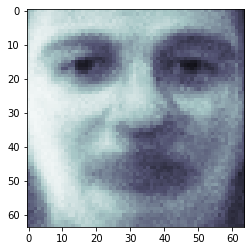

Epoch 121


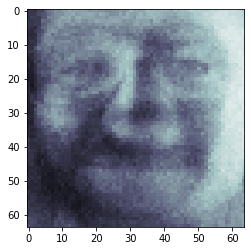

Epoch 122


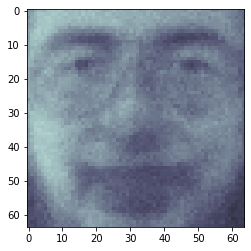

Epoch 123


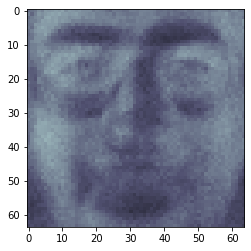

Epoch 124


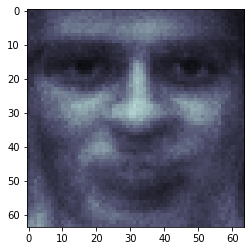

Epoch 125


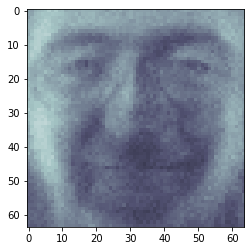

Epoch 126


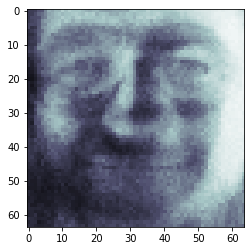

Epoch 127


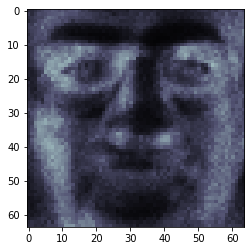

Epoch 128


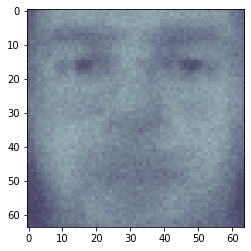

Epoch 129


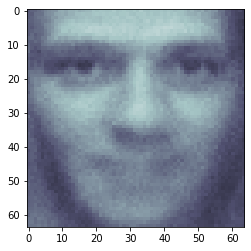

Epoch 130


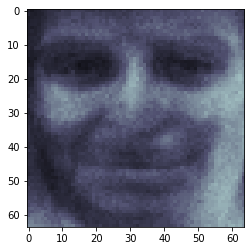

Epoch 131


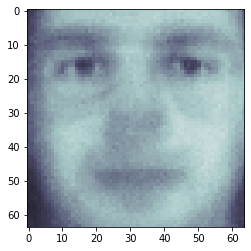

Epoch 132


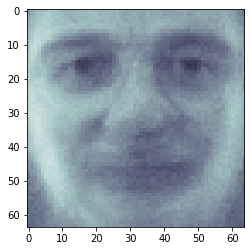

Epoch 133


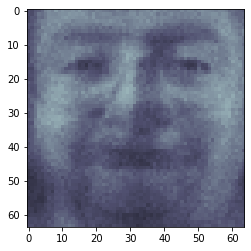

Epoch 134


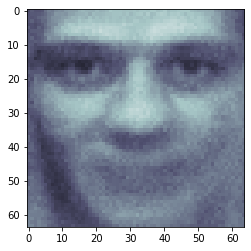

Epoch 135


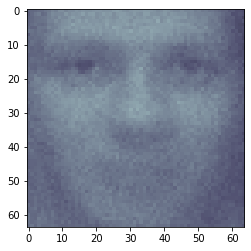

Epoch 136


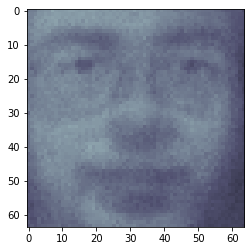

Epoch 137


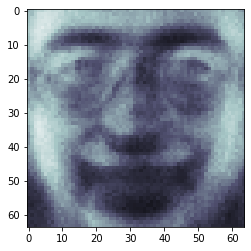

Epoch 138


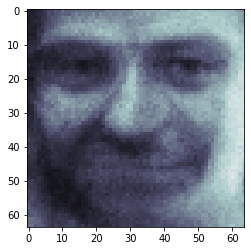

Epoch 139


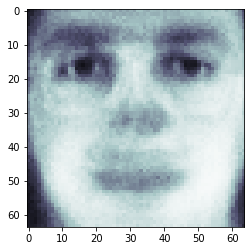

Epoch 140


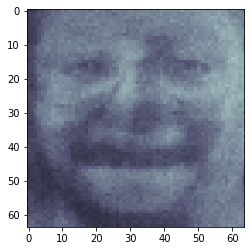

Epoch 141


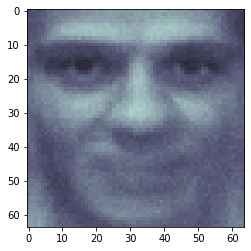

Epoch 142


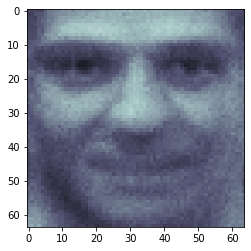

Epoch 143


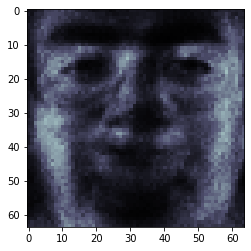

Epoch 144


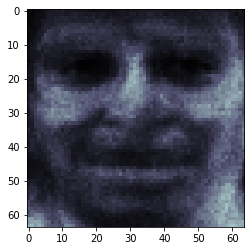

Epoch 145


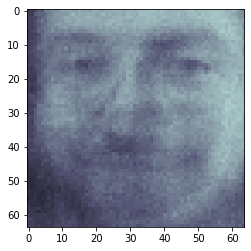

Epoch 146


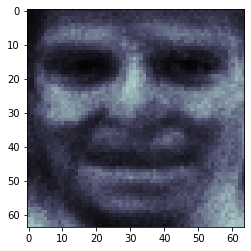

Epoch 147


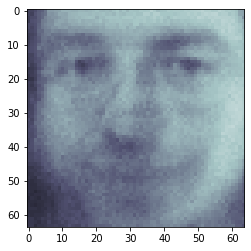

Epoch 148


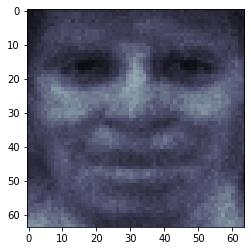

Epoch 149


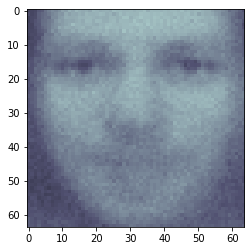

Epoch 150


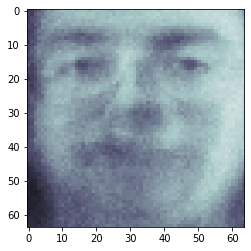

Epoch 151


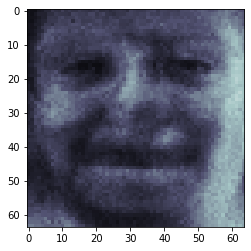

Epoch 152


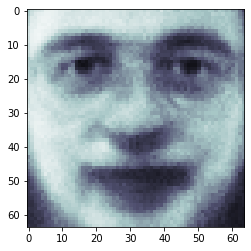

Epoch 153


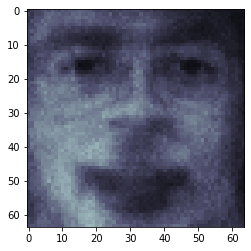

Epoch 154


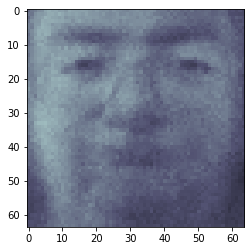

Epoch 155


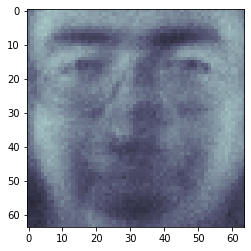

Epoch 156


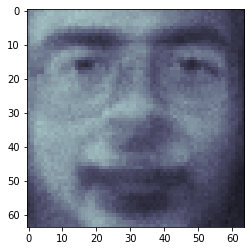

Epoch 157


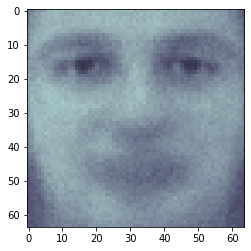

Epoch 158


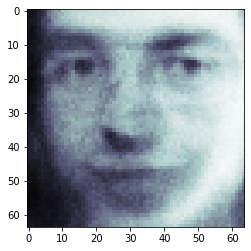

Epoch 159


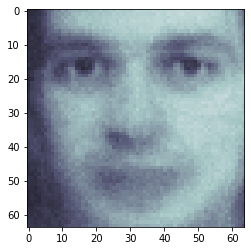

Epoch 160


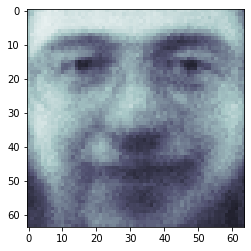

Epoch 161


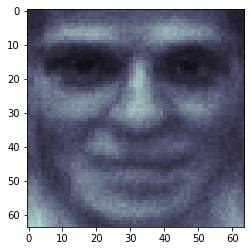

Epoch 162


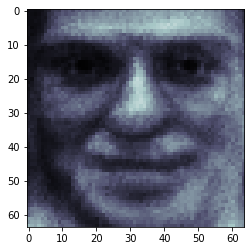

Epoch 163


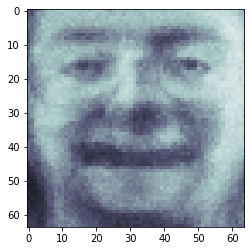

Epoch 164


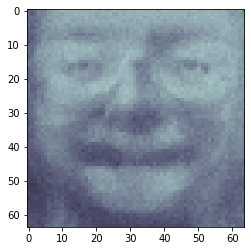

Epoch 165


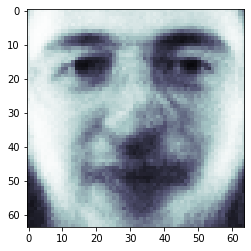

Epoch 166


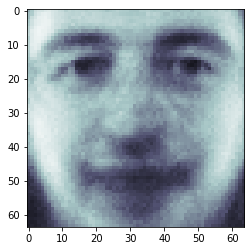

Epoch 167


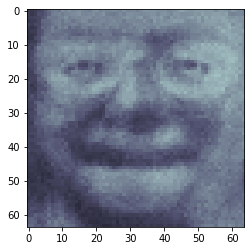

Epoch 168


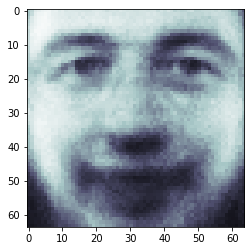

Epoch 169


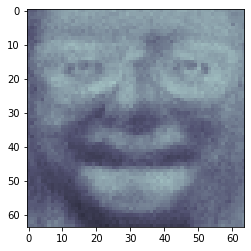

Epoch 170


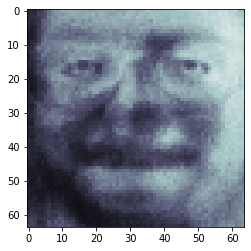

Epoch 171


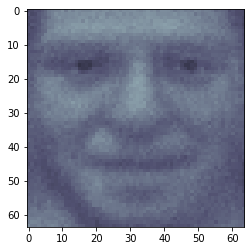

Epoch 172


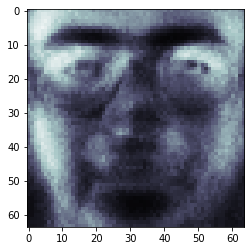

Epoch 173


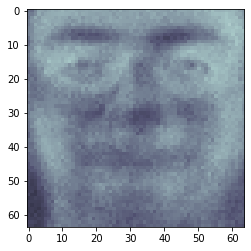

Epoch 174


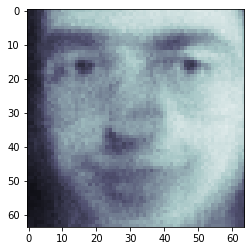

Epoch 175


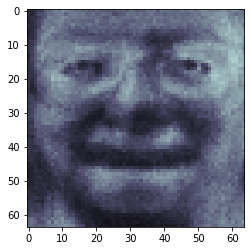

Epoch 176


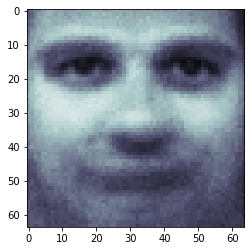

Epoch 177


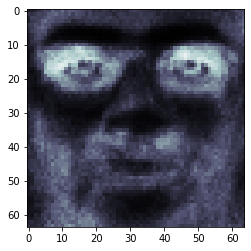

Epoch 178


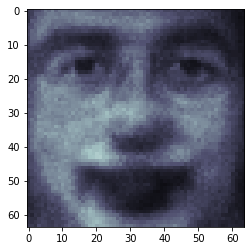

Epoch 179


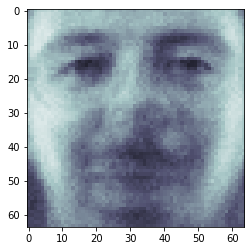

Epoch 180


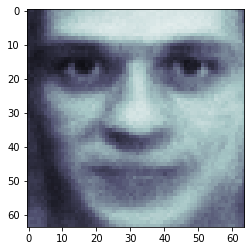

Epoch 181


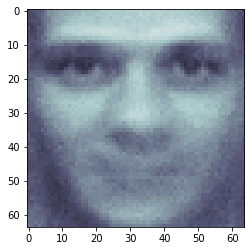

Epoch 182


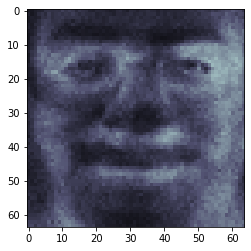

Epoch 183


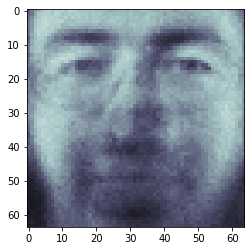

Epoch 184


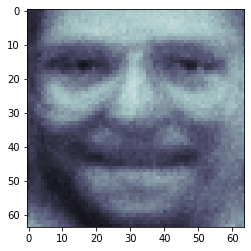

Epoch 185


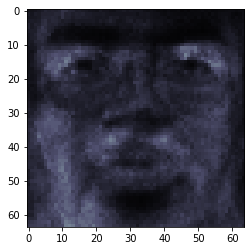

Epoch 186


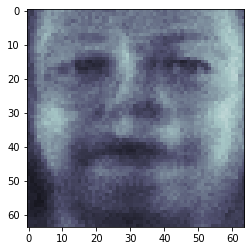

Epoch 187


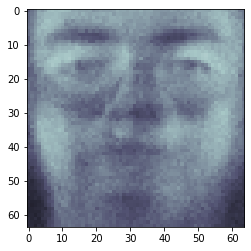

Epoch 188


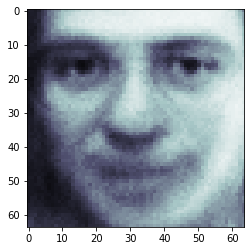

Epoch 189


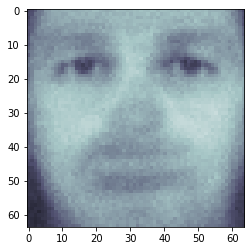

Epoch 190


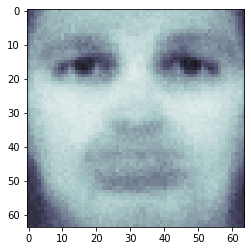

Epoch 191


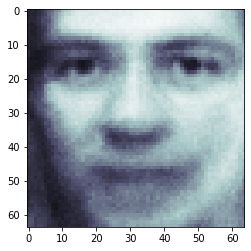

Epoch 192


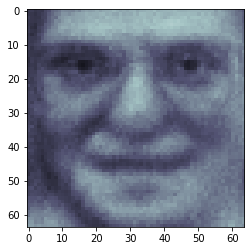

Epoch 193


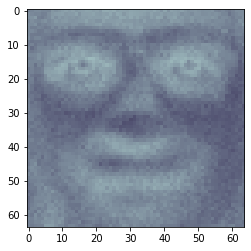

Epoch 194


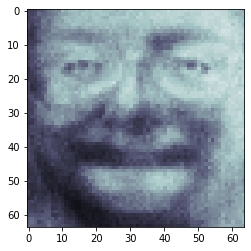

Epoch 195


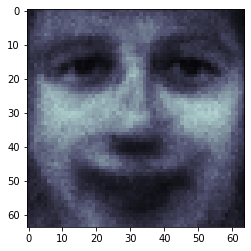

Epoch 196


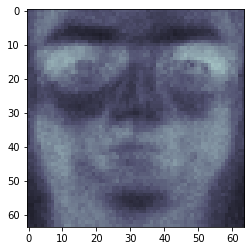

Epoch 197


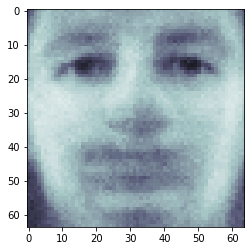

Epoch 198


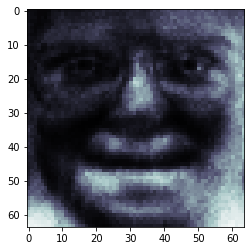

Epoch 199


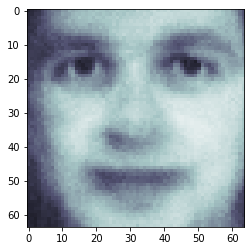

In [ ]:
D_eigenfaces = Discriminator64x64().to(device)
G_eigenfaces = Generator64x64().to(device)
train(D_eigenfaces, G_eigenfaces, train_loader_eigenfaces, '64x64', 200)

In [ ]:
evaluate_disc(D_eigenfaces, G_eigenfaces, train_loader_eigenfaces)

[[367.49765]
 [308.09906]
 [246.88737]
 [510.8837 ]
 [386.66263]
 [158.11151]
 [190.49211]
 [351.932  ]
 [132.44382]
 [205.27934]]
[[1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]
 [1.]]

[[62.46062]]
[[1.]]
[[3.6245263]]
[[1.]]
[[37.98225]]
[[1.]]
[[35.198273]]
[[1.]]
[[7.677068]]
[[1.]]
[[-166.4902]]
[[-1.]]
[[-9.611862]]
[[-1.]]
[[42.411377]]
[[1.]]
[[73.3222]]
[[1.]]
[[-20.62922]]
[[-1.]]


Real Percentage Correct: 96.75%
Fake Percentage Correct: 27.32%


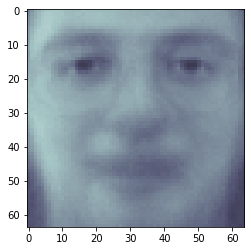

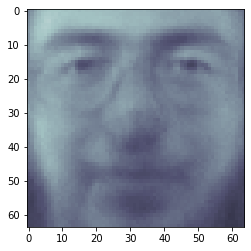

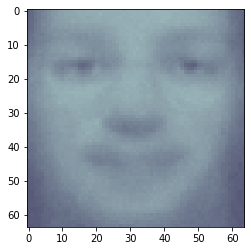

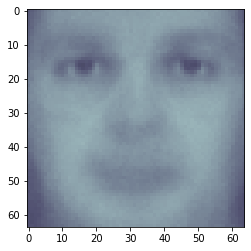

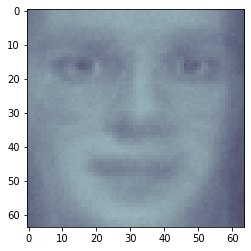

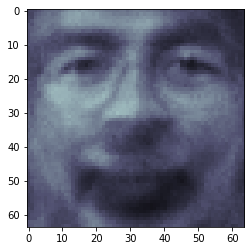

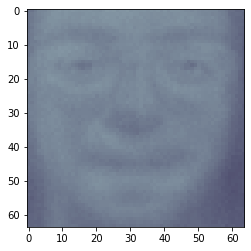

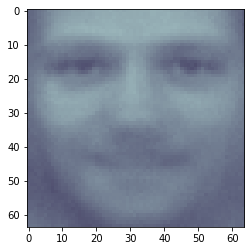

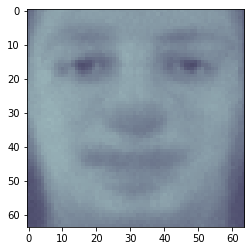

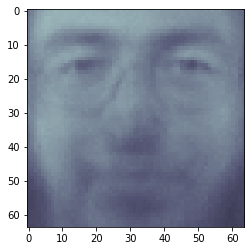

In [ ]:
evaluate_gen(G_eigenfaces, '64x64')

# Labeled Faces in the Wild GAN

## Procure Labeled Faces in the Wild Dataset

(13233, 62, 47)


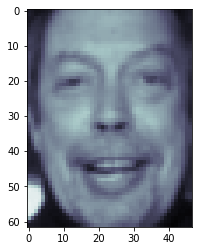

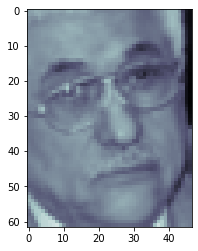

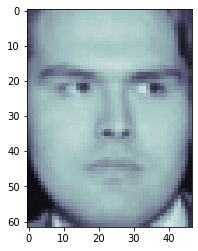

In [ ]:
X_train_lfw = datasets.fetch_lfw_people().images / 255
print(X_train_lfw.shape)

for i in range(3):
  imshow(X_train_lfw[i], cmap=plt.cm.bone, vmin=0, vmax=1)
  plt.show()

Show average image as baseline reference

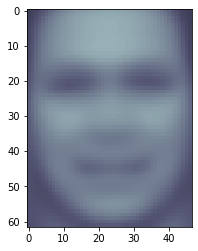

In [ ]:
average_lfw = np.sum(X_train_lfw, axis=0)/X_train_lfw.shape[0]
imshow(average_lfw, cmap=plt.cm.bone, vmin=0, vmax=1)
plt.show()

Turn dataset into dataloader as input to model

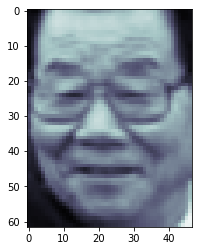

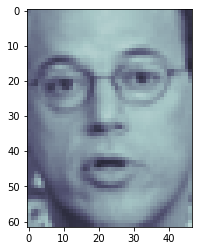

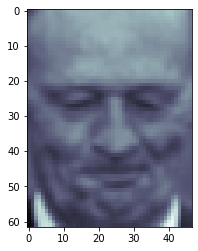

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5), (0.5))])

train_dataset_lfw = MyDataset(X_train_lfw, transform)
train_loader_lfw = DataLoader(train_dataset_lfw, batch_size=10, shuffle=True, num_workers=2, pin_memory=torch.cuda.is_available())

for batch_idx, X_batch in enumerate(train_loader_lfw):
  if batch_idx < 3:
    pic = Variable(X_batch)
    imshow(np.asarray(pic[0][0].detach().cpu().numpy()), cmap=plt.cm.bone, vmin=-1, vmax=1)
    plt.show()
  else:
    break

## Run Labeled Faces in the Wild GAN

Epoch 0


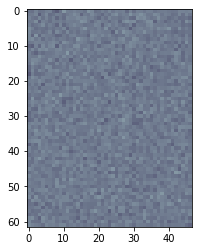

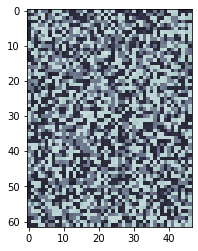

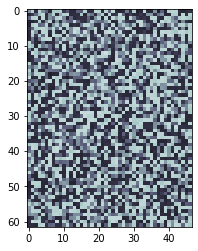

Traceback (most recent call last):
  File "/usr/lib/python3.7/multiprocessing/queues.py", line 232, in _feed
    close()
  File "/usr/lib/python3.7/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/usr/lib/python3.7/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


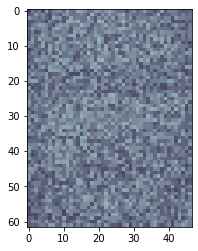

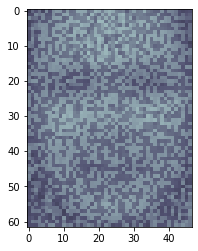

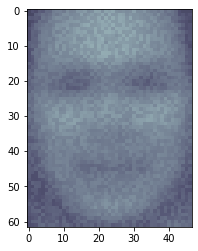

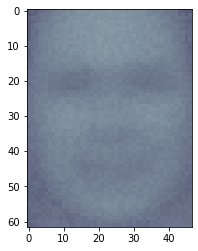

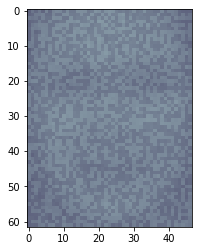

...

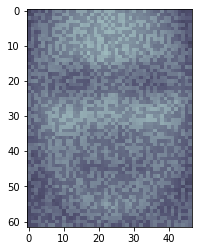

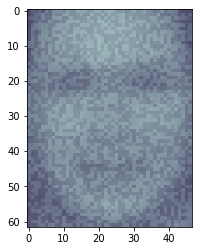

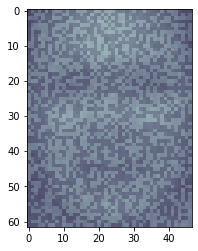

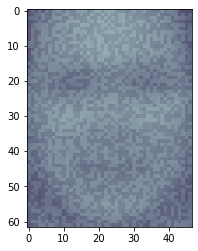

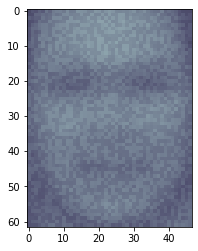

Epoch 1


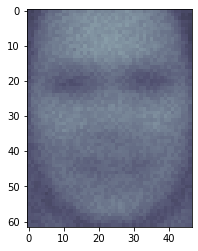

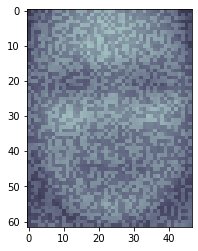

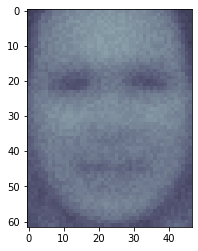

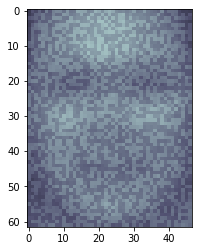

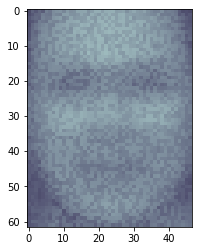

...

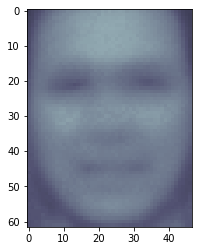

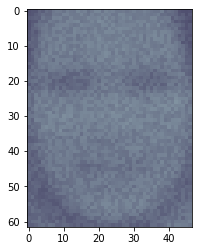

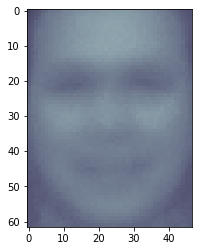

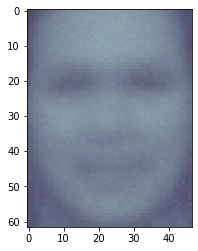

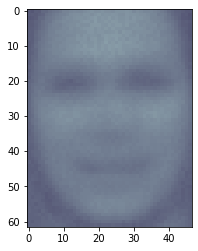

Epoch 2


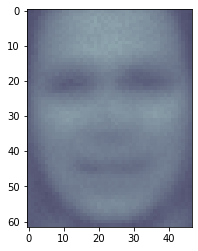

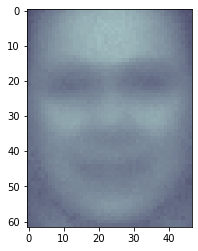

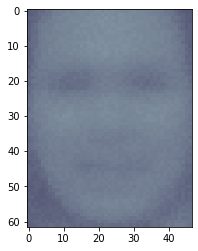

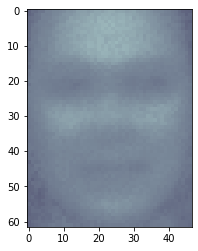

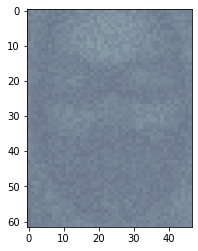

...

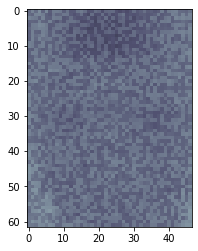

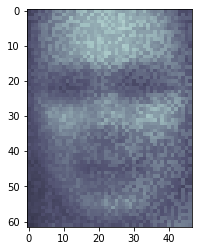

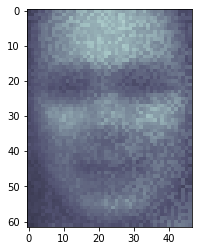

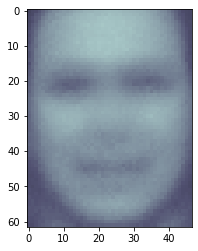

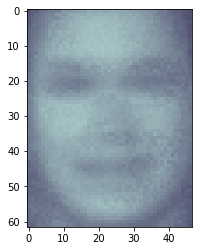

Epoch 3


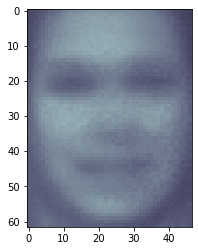

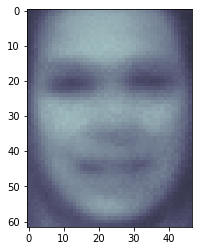

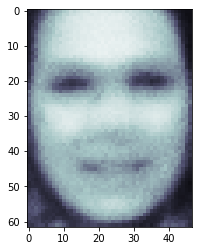

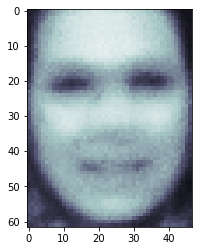

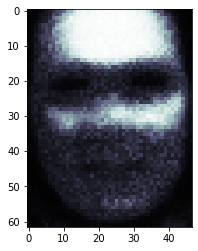

...

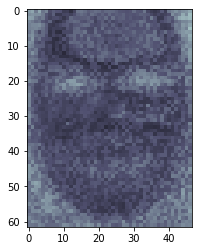

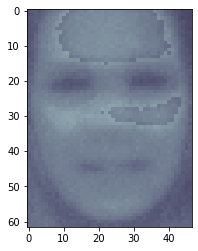

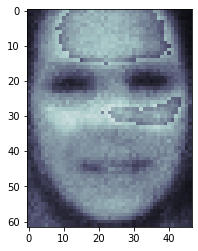

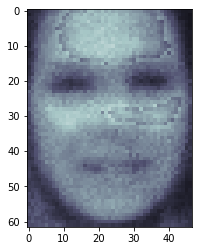

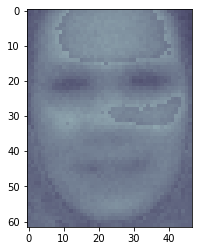

Epoch 4


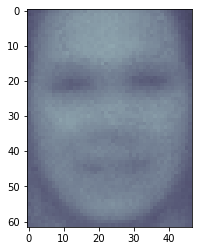

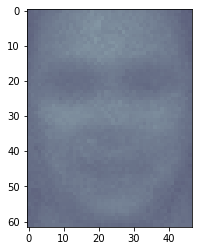

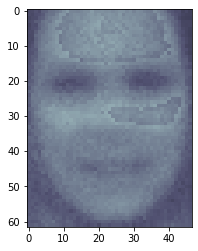

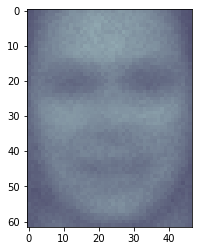

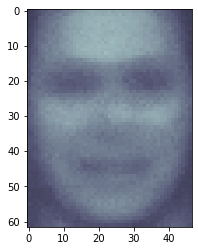

...

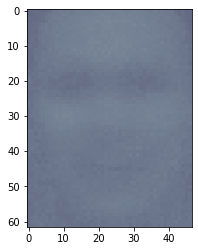

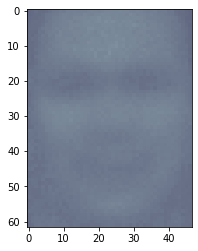

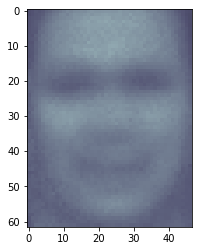

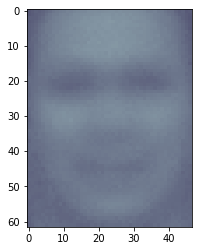

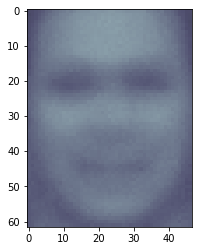

Epoch 5


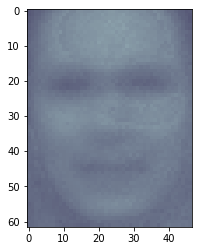

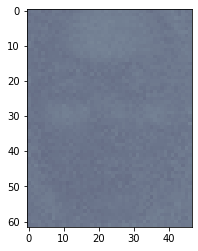

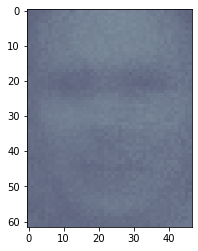

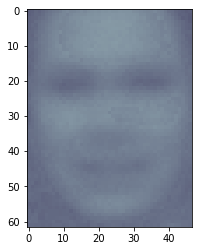

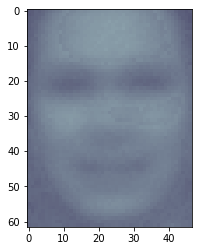

...

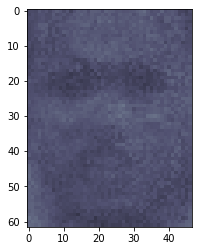

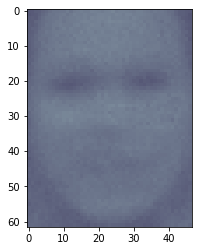

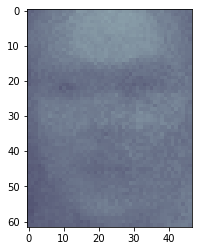

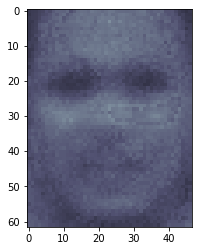

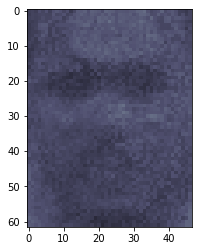

Epoch 6


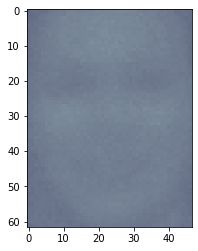

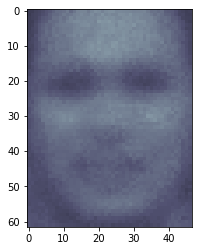

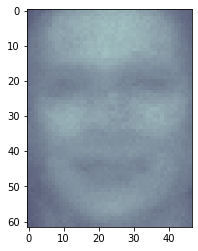

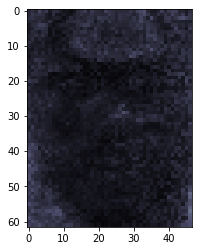

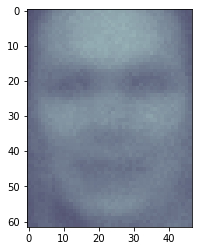

...

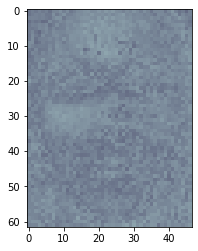

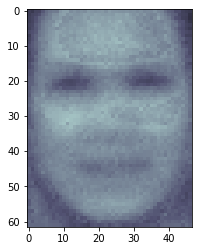

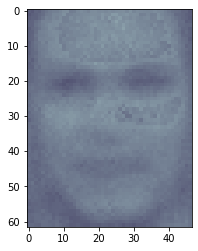

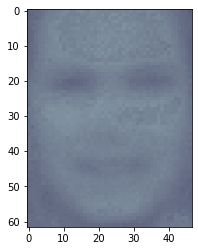

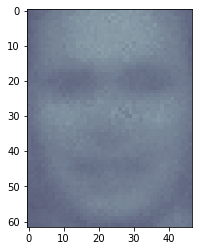

Epoch 7


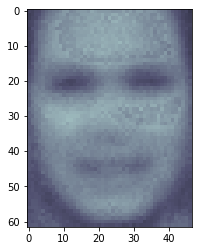

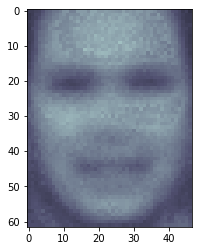

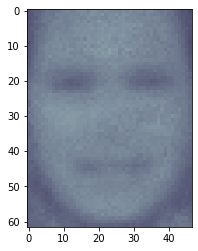

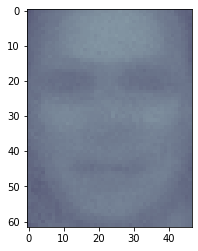

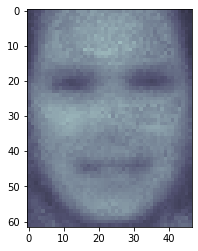

...

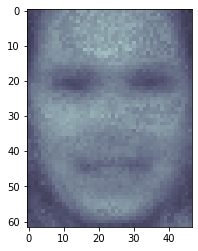

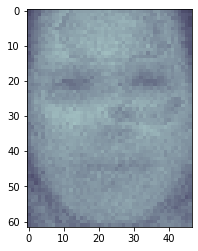

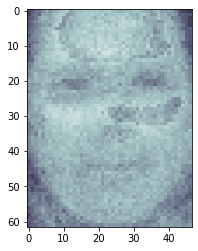

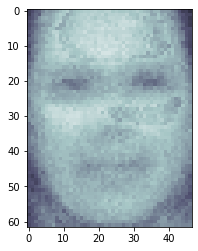

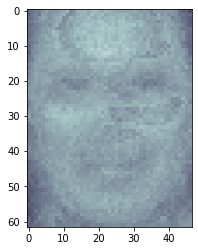

Epoch 8


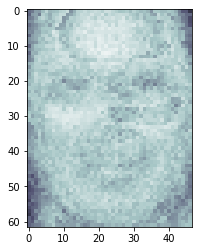

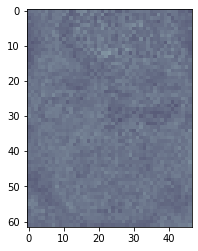

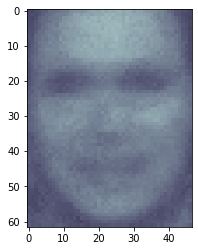

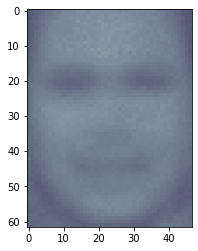

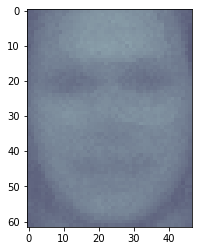

...

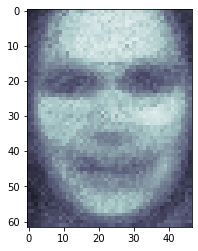

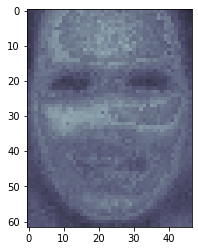

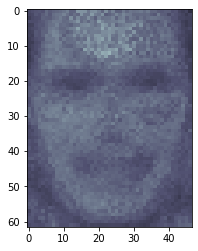

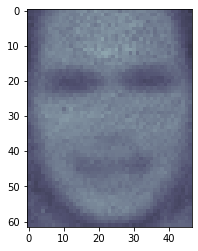

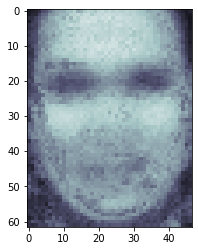

Epoch 9


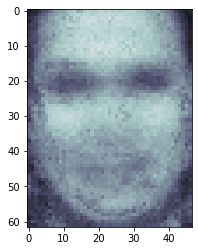

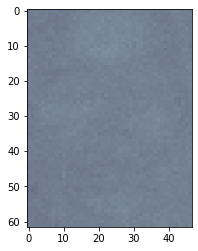

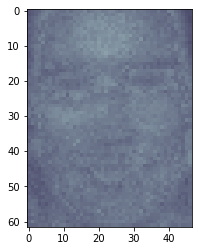

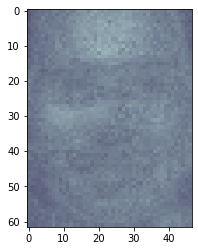

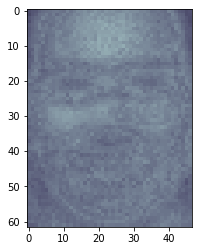

...

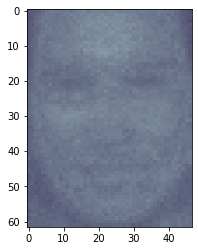

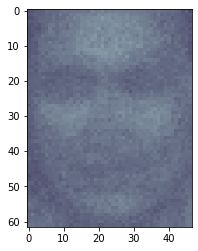

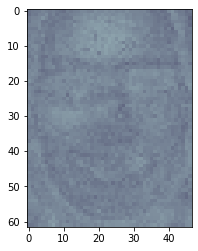

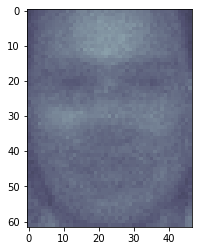

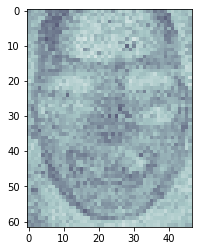

Epoch 10


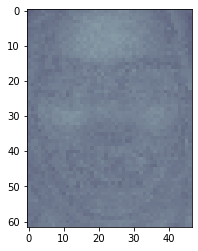

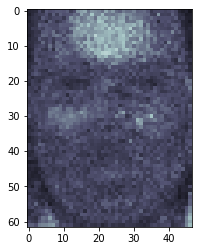

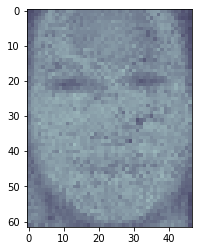

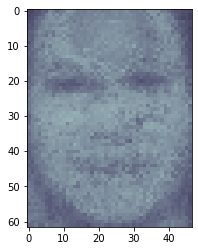

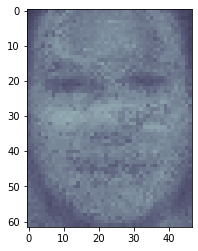

...

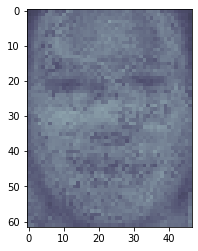

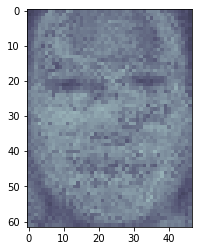

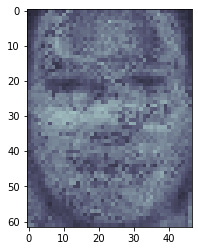

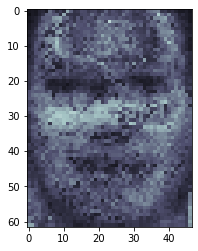

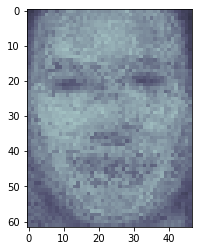

Epoch 11


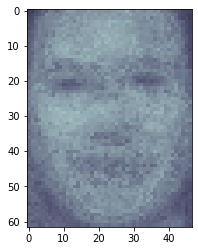

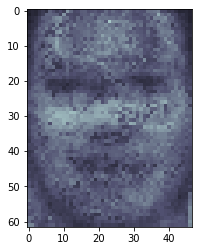

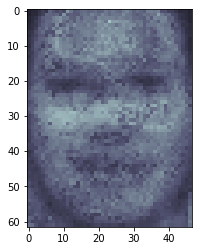

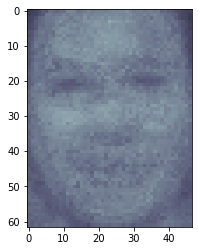

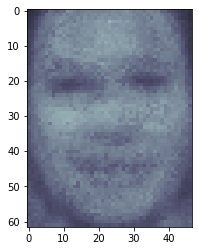

...

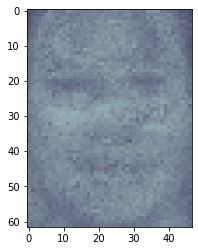

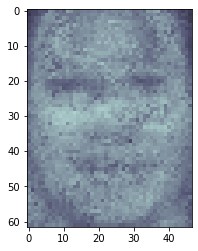

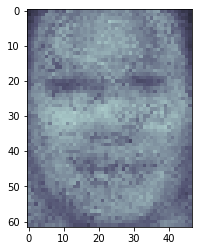

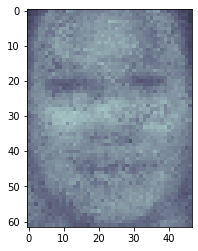

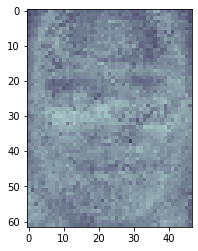

Epoch 12


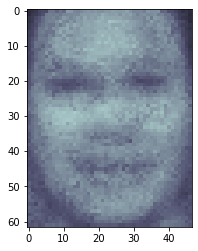

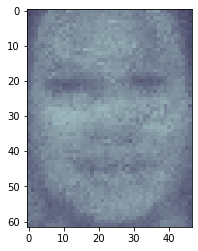

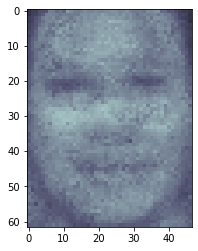

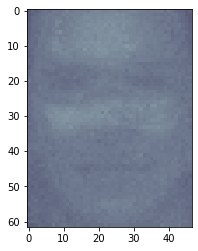

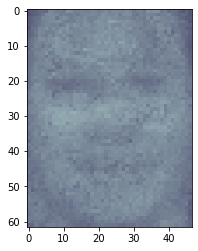

...

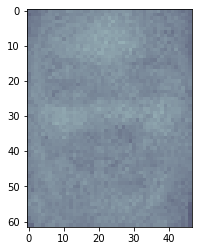

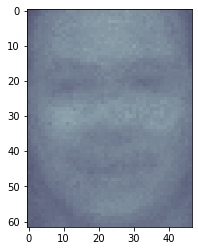

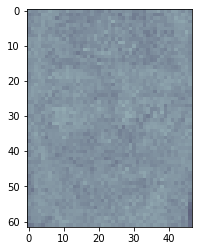

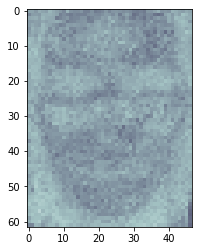

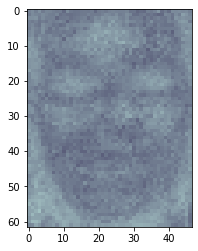

Epoch 13


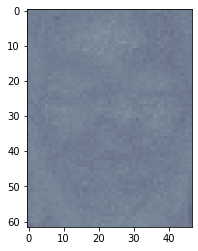

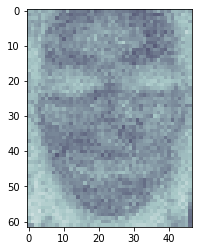

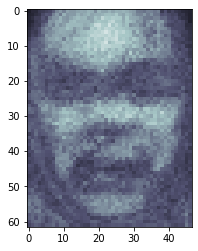

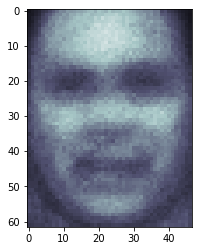

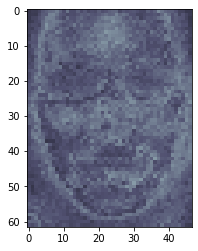

...

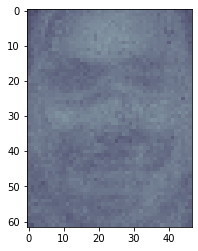

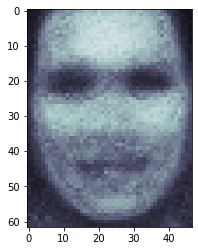

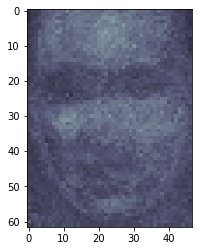

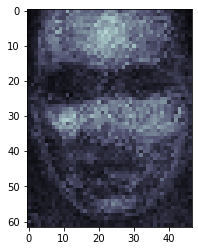

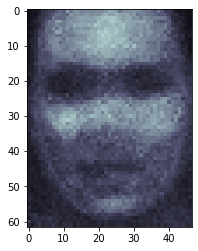

Epoch 14


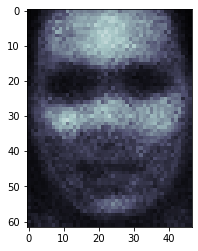

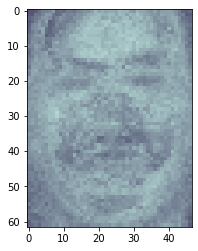

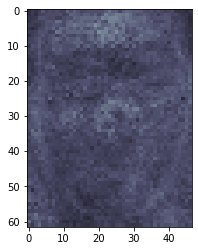

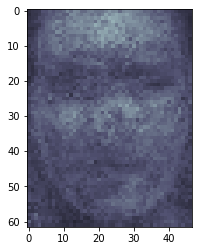

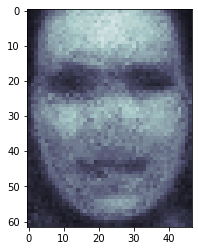

...

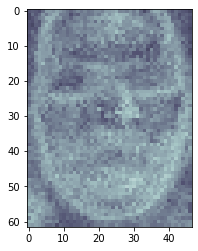

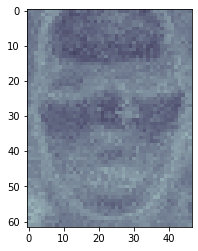

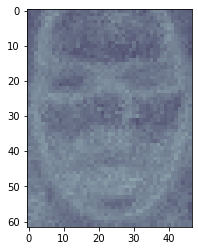

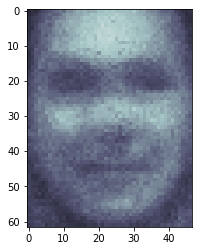

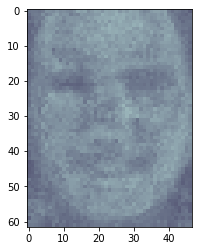

Epoch 15


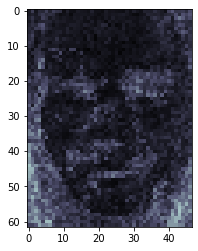

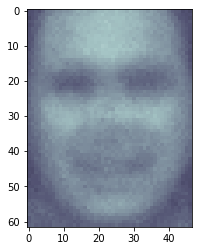

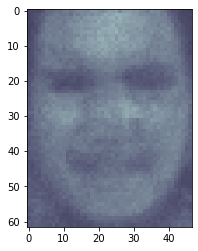

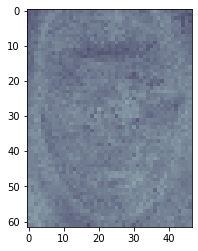

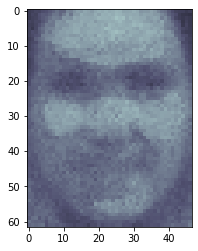

...

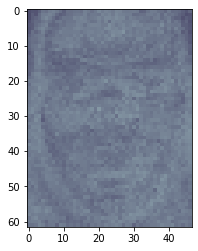

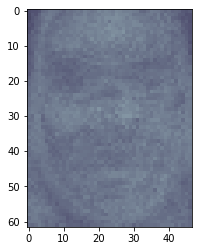

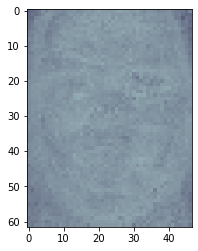

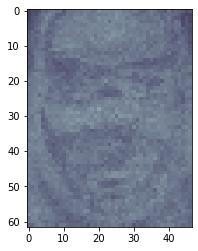

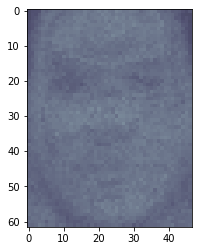

Epoch 16


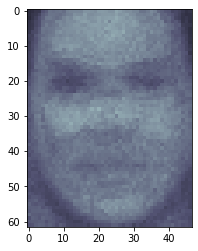

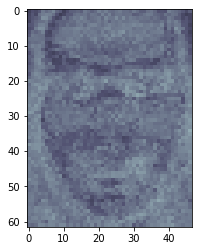

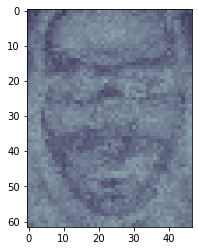

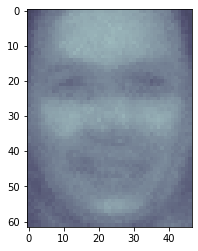

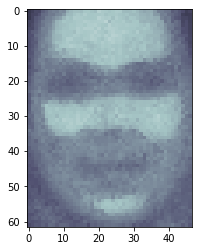

...

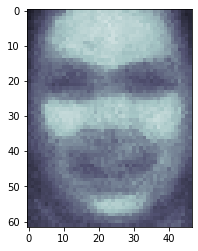

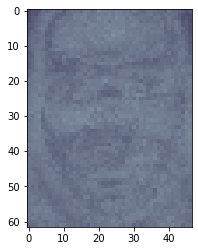

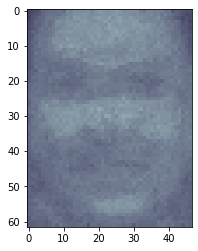

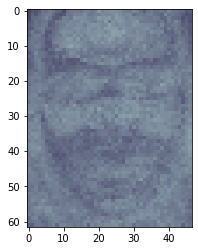

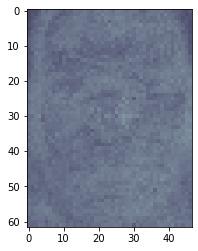

Epoch 17


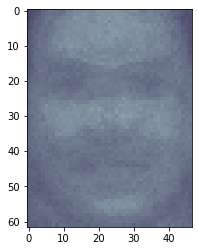

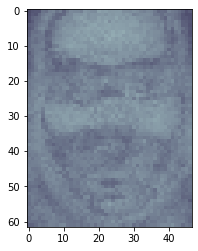

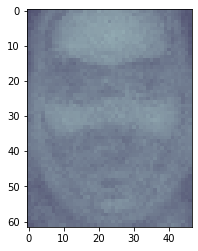

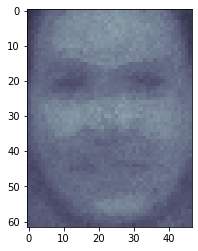

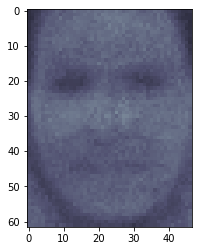

...

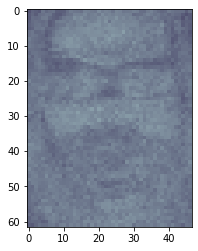

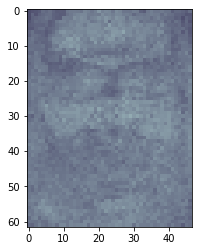

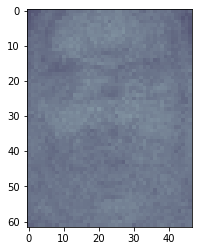

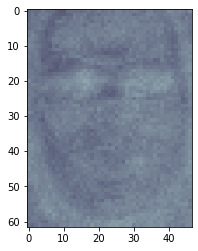

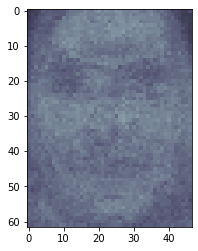

Epoch 18


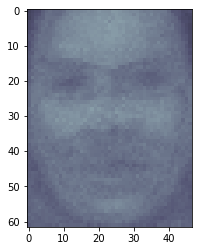

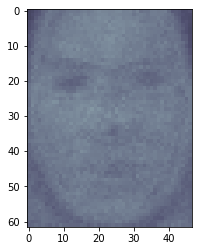

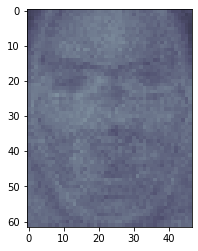

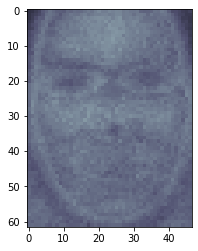

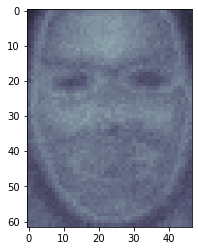

...

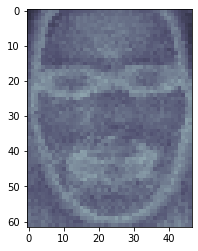

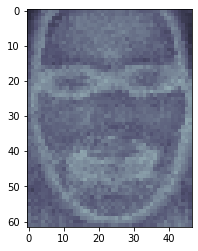

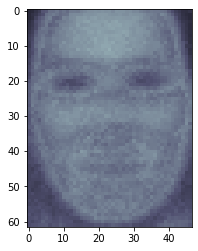

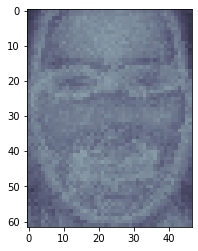

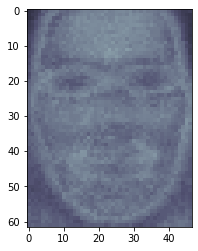

Epoch 19


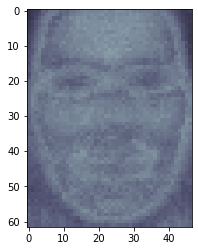

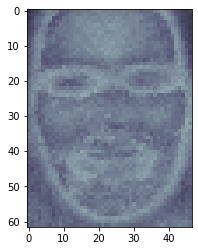

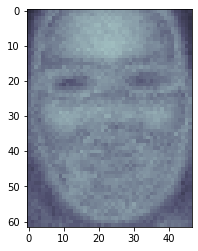

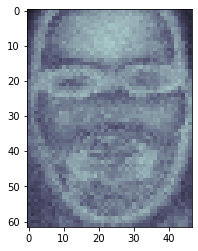

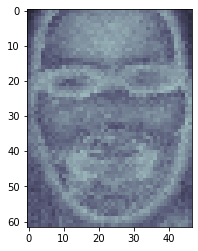

...

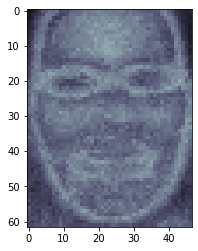

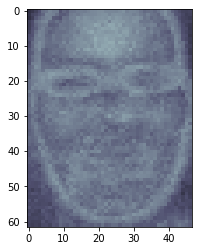

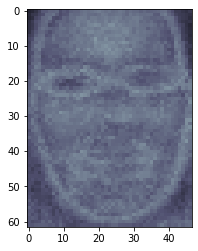

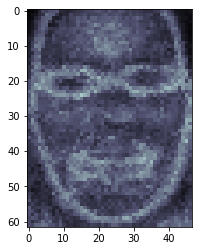

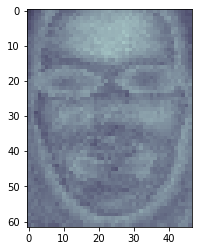

Epoch 20


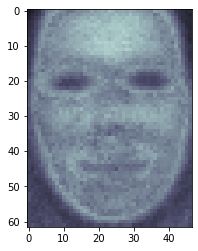

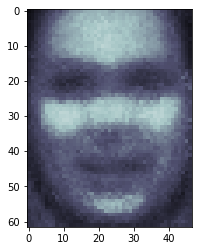

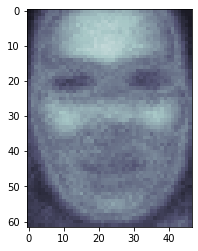

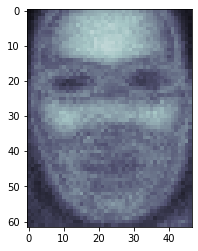

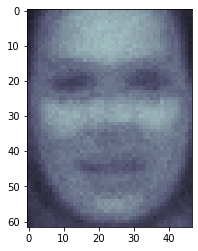

...

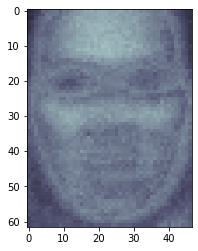

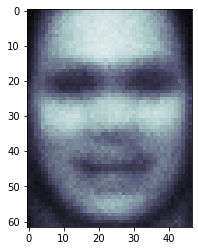

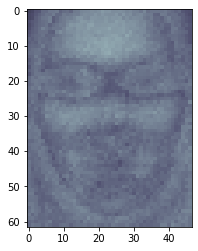

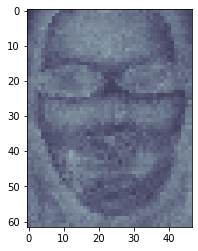

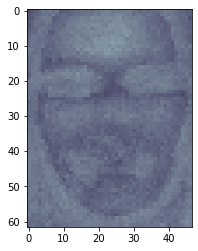

Epoch 21


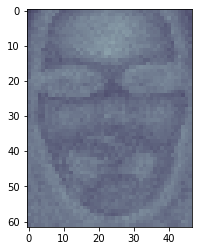

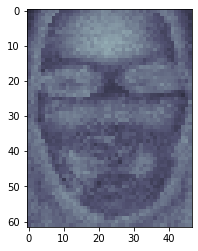

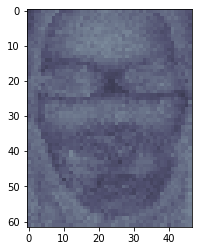

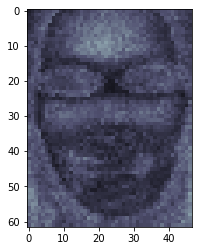

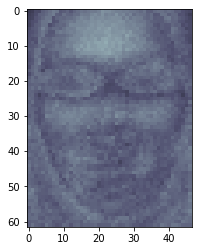

...

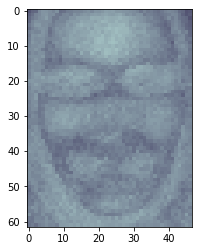

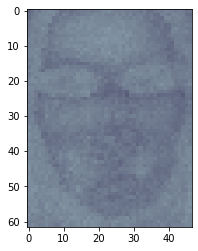

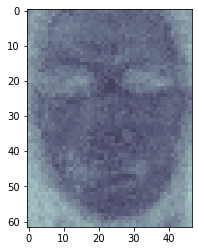

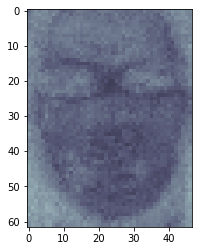

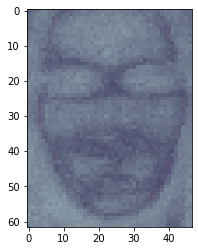

Epoch 22


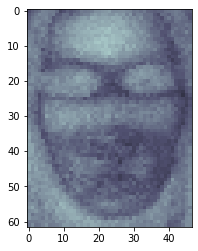

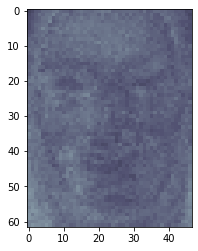

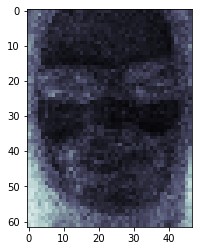

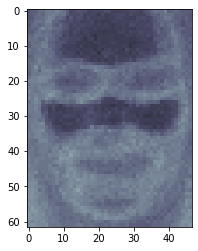

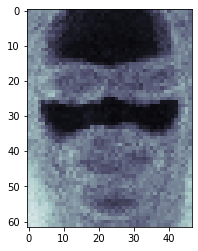

...

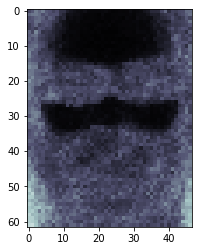

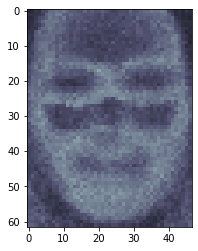

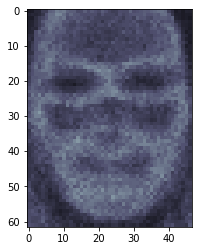

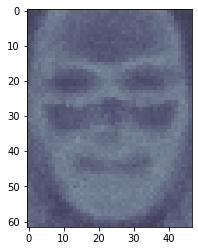

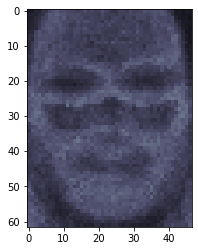

Epoch 23


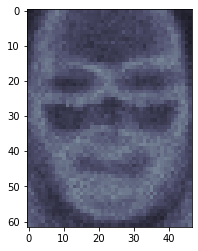

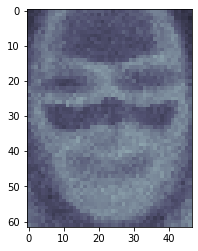

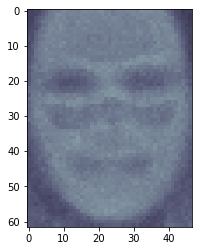

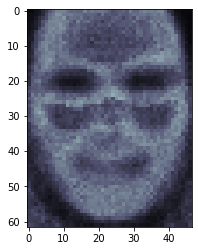

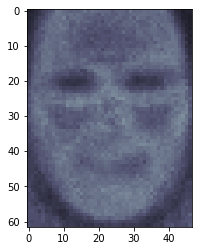

...

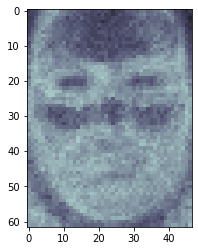

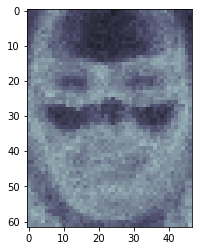

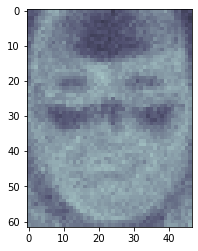

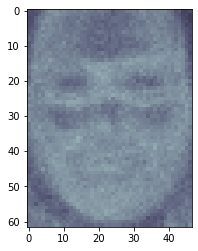

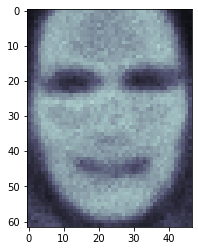

Epoch 24


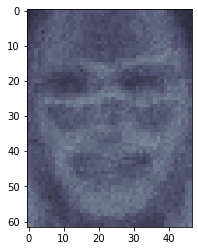

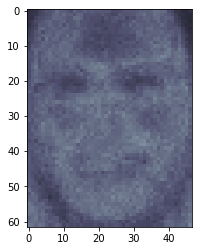

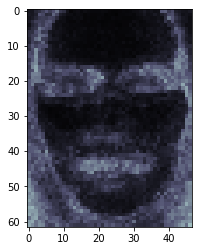

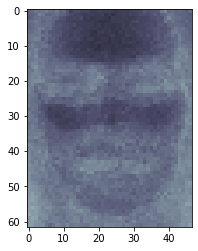

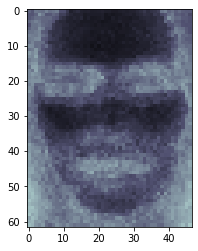

...

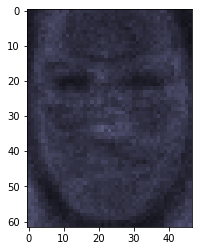

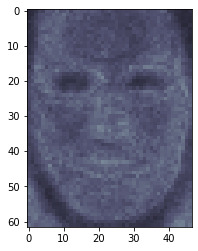

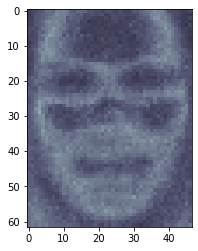

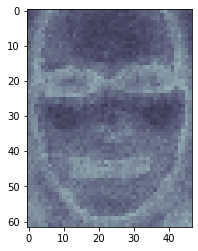

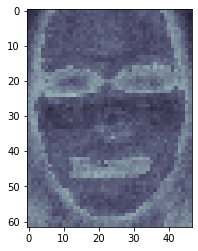

Epoch 25


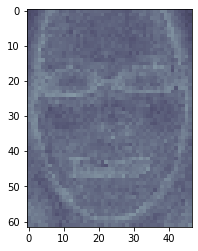

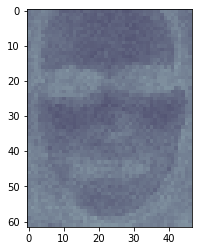

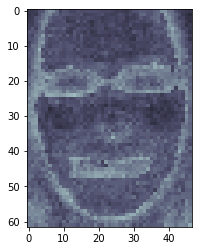

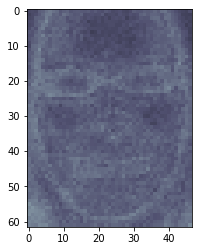

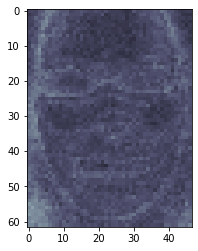

...

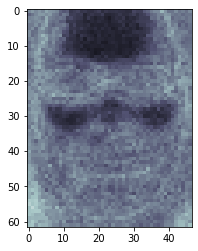

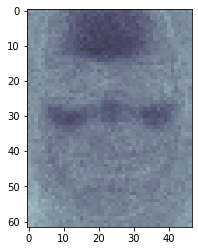

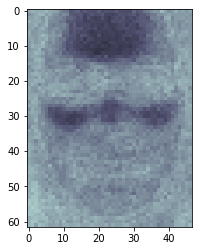

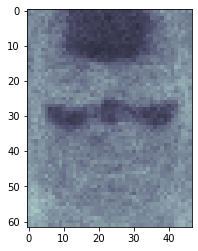

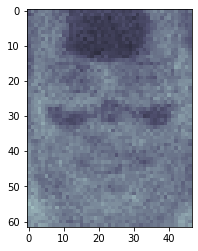

Epoch 26


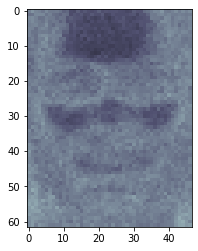

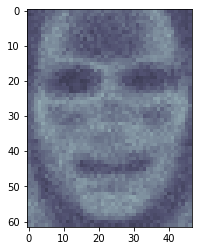

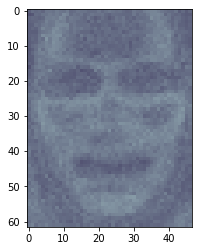

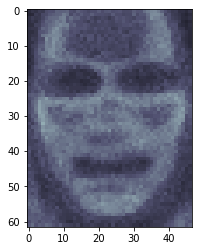

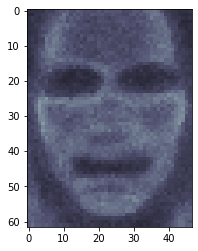

...

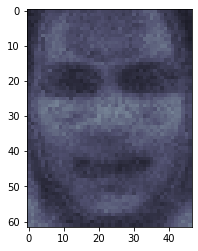

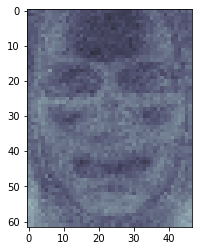

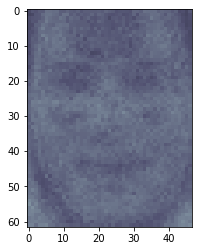

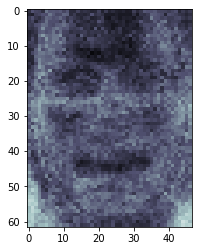

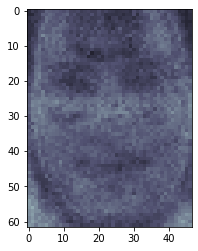

Epoch 27


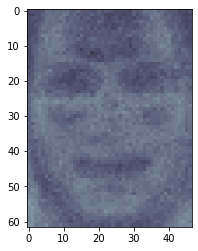

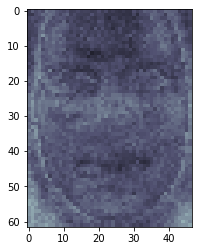

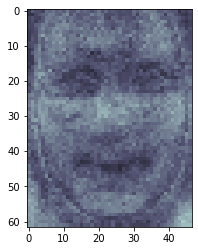

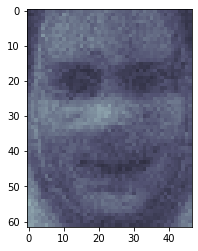

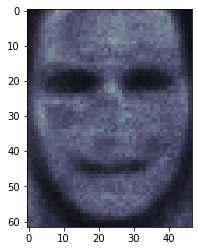

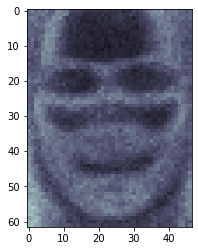

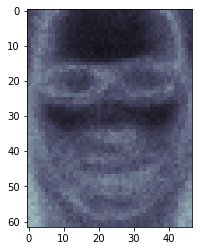

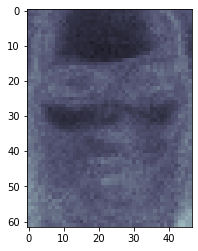

KeyboardInterrupt: ignored

In [ ]:
D_lfw = Discriminator62x47().to(device)
G_lfw = Generator62x47().to(device)
train(D_lfw, G_lfw, train_loader_lfw, '62x47', 50)

In [ ]:
evaluate_disc(D_lfw, G_lfw, train_loader_lfw)

[[   7077.9307]
 [-158867.73  ]
 [ 160524.52  ]
 [ 289823.56  ]
 [ 134579.39  ]
 [-300725.6   ]
 [-100456.02  ]
 [ 312297.4   ]
 [ -58643.125 ]
 [  49989.438 ]]
[[ 1.]
 [-1.]
 [ 1.]
 [ 1.]
 [ 1.]
 [-1.]
 [-1.]
 [ 1.]
 [-1.]
 [ 1.]]

[[-62327.48]]
[[-1.]]
[[-67417.33]]
[[-1.]]
[[-69528.836]]
[[-1.]]
[[-56694.113]]
[[-1.]]
[[-3329.473]]
[[-1.]]
[[-45288.05]]
[[-1.]]
[[-68681.47]]
[[-1.]]
[[-18518.35]]
[[-1.]]
[[-64682.715]]
[[-1.]]
[[-27078.664]]
[[-1.]]


Real Percentage Correct: 73.56495468277946%
Fake Percentage Correct: 70.84%


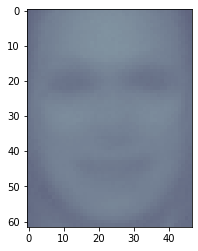

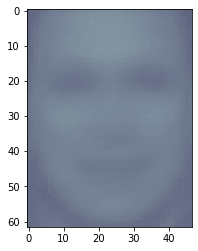

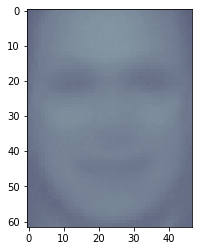

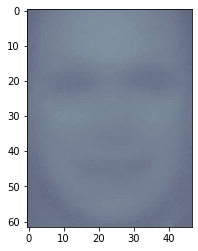

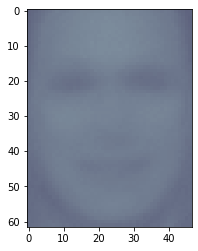

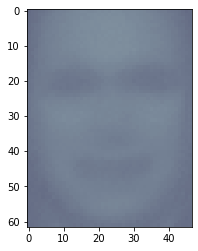

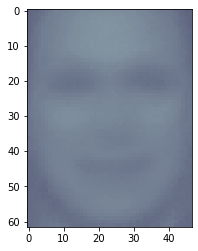

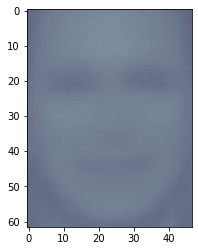

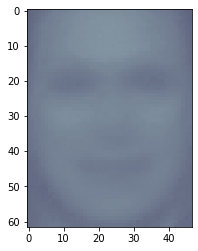

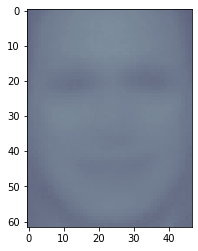

In [ ]:
evaluate_gen(G_lfw, '62x47')

# Image GAN

## Import Image Files

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
abstract_art_path = "/content/gdrive/MyDrive/archive/Abstract_gallery/Abstract_image_"
images = np.empty((100, 100, 100, 3)) #total should be 2782
for i in range(images.shape[0]):
  im_path = abstract_art_path + str(i) + '.jpg'
  im = Image.open(im_path)
  im = (np.asarray(im.resize((100, 100))) / 255).astype('float32')
  images[i, :, :, :] = im
print(images.shape)

(100, 100, 100, 3)


Show average image as baseline reference

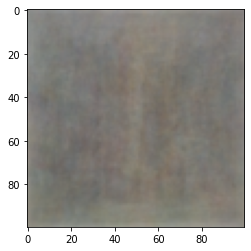

In [ ]:
average_images = np.sum(images, axis=0)/images.shape[0]
imshow(average_images)
plt.show()

Turn dataset into dataloader as input to model

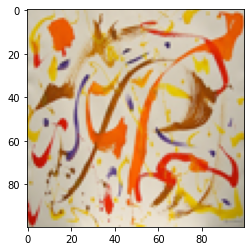

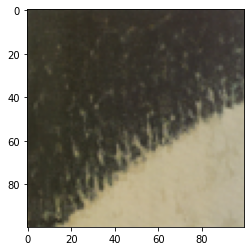

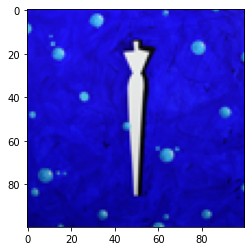

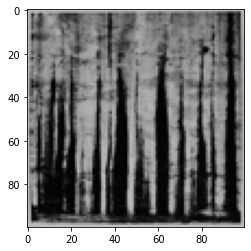

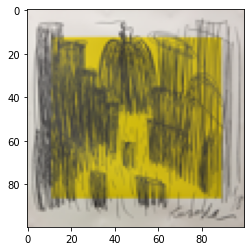

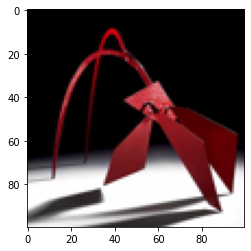

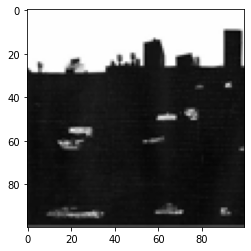

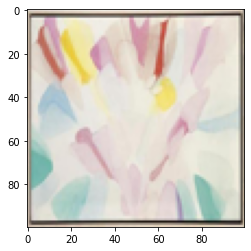

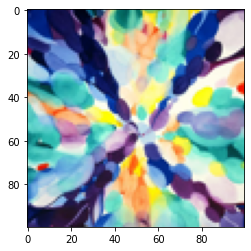

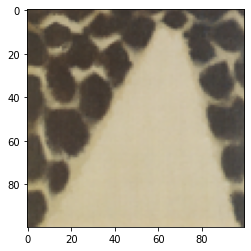

In [ ]:
transform = transforms.Compose([transforms.ToTensor()])
train_dataset_true = MyDataset(images, transform)
train_loader_true = DataLoader(train_dataset_true, batch_size=5, shuffle=True, num_workers=2, pin_memory=torch.cuda.is_available())

#for batch_idx, (X_batch, _) in enumerate(train_loader_true):
for batch_idx, X_batch in enumerate(train_loader_true):
  if batch_idx < 10:
    pic = Variable(X_batch)
    pic = np.asarray(pic[0].detach().cpu().numpy())
    pic = np.moveaxis(pic, 0, -1)
    imshow(pic)
    plt.show()
  else:
    break

## Image Discriminator Models

We have multiple discriminator functions, since they are less successful than the grayscale images

In [ ]:
class DiscriminatorIm0(nn.Module):
  def __init__(self):
    super().__init__()

    self.conv1 = nn.Conv2d(3, 10, kernel_size=2)
    self.conv2 = nn.Conv2d(10, 20, kernel_size=2)
    self.conv3 = nn.Conv2d(20, 20, kernel_size=2)
    self.conv4 = nn.Conv2d(20, 10, kernel_size=2)

    self.lin1 = nn.Linear(48400, 1000)
    self.lin2 = nn.Linear(1000, 100)
    self.lin3 = nn.Linear(100, 1)

    self.batchnorm10 = nn.BatchNorm2d(10)
    self.batchnorm20 = nn.BatchNorm2d(20)

    self.maxpool = nn.MaxPool2d(2)

    self.relu = nn.ReLU()
    self.leakyrelu = nn.LeakyReLU(0.1)
    self.sigmoid = nn.Sigmoid()

    

  def forward(self, x):
    x = self.conv1(x)
    x = self.batchnorm10(x)
    x = self.leakyrelu(x)
    x = self.maxpool(x)

    x = self.conv2(x)
    x = self.batchnorm20(x)
    x = self.relu(x)
    x = self.maxpool(x)

    x = self.conv3(x)
    x = self.leakyrelu(x)

    x = self.conv4(x)
    x = self.relu(x)

    x = x.reshape(-1, 48400)
    
    x = self.lin1(x)
    x = self.leakyrelu(x)
    x = self.lin2(x)
    x = self.relu(x)
    x = self.lin3(x)

    return x.squeeze()

In [ ]:
class DiscriminatorIm1(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(30000, 10000)
        self.lin2 = nn.Linear(10000, 1000)
        self.lin3 = nn.Linear(1000, 250)
        self.lin4 = nn.Linear(250, 1)
        self.leakyrelu = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = t.reshape(-1, 30000)
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.lin4(x)
        return x

In [ ]:
class DiscriminatorIm2(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(30000, 10000)
        self.lin2 = nn.Linear(10000, 1000)
        self.lin3 = nn.Linear(1000, 250)
        self.lin4 = nn.Linear(250, 1)
        self.lin5 = nn.Linear(3, 1)

        self.leakyrelu = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = x.reshape(-1, 30000)
        t1 = self.lin1(x)
        t1 = self.leakyrelu(t1)
        t1 = self.lin2(t1)
        t1 = self.leakyrelu(t1)
        t1 = self.lin3(t1)
        t1 = self.leakyrelu(t1)
        t1 = self.lin4(t1)

        t2 = self.lin1(x)
        t2 = self.leakyrelu(t2)
        t2 = self.lin2(t2)
        t2 = self.leakyrelu(t2)
        t2 = self.lin3(t2)
        t2 = self.leakyrelu(t2)
        t2 = self.lin4(t2)

        t3 = self.lin1(x)
        t3 = self.leakyrelu(t3)
        t3 = self.lin2(t3)
        t3 = self.leakyrelu(t3)
        t3 = self.lin3(t3)
        t3 = self.leakyrelu(t3)
        t3 = self.lin4(t3)

        t = torch.cat((t1, t2, t3), axis=1)
        t = self.lin5(t)
        
        return t

In [ ]:
class DiscriminatorIm3(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin11 = nn.Linear(30000, 10000)
        self.lin12 = nn.Linear(10000, 1000)
        self.lin13 = nn.Linear(1000, 250)
        self.lin14 = nn.Linear(250, 1)

        self.lin21 = nn.Linear(30000, 10000)
        self.lin22 = nn.Linear(10000, 1000)
        self.lin23 = nn.Linear(1000, 250)
        self.lin24 = nn.Linear(250, 1)

        self.lin31 = nn.Linear(30000, 10000)
        self.lin32 = nn.Linear(10000, 1000)
        self.lin33 = nn.Linear(1000, 250)
        self.lin34 = nn.Linear(250, 1)
        
        self.lin5 = nn.Linear(3, 1)

        self.leakyrelu = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = x.reshape(-1, 30000)
        t1 = self.lin11(x)
        t1 = self.leakyrelu(t1)
        t1 = self.lin12(t1)
        t1 = self.leakyrelu(t1)
        t1 = self.lin13(t1)
        t1 = self.leakyrelu(t1)
        t1 = self.lin14(t1)

        t2 = self.lin21(x)
        t2 = self.leakyrelu(t2)
        t2 = self.lin22(t2)
        t2 = self.leakyrelu(t2)
        t2 = self.lin23(t2)
        t2 = self.leakyrelu(t2)
        t2 = self.lin24(t2)

        t3 = self.lin31(x)
        t3 = self.leakyrelu(t3)
        t3 = self.lin32(t3)
        t3 = self.leakyrelu(t3)
        t3 = self.lin33(t3)
        t3 = self.leakyrelu(t3)
        t3 = self.lin34(t3)

        t = torch.cat((t1, t2, t3), axis=1)
        t = self.lin5(t)
        
        return t

In [ ]:
class DiscriminatorIm4(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(3, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 10, kernel_size=5)

        self.lin1 = nn.Linear(30000, 10000)
        self.lin2 = nn.Linear(10000, 1000)
        self.lin3 = nn.Linear(1000, 250)
        self.lin4 = nn.Linear(250, 1)
        self.leakyrelu = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = x.reshape(-1, 30000)
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.lin4(x)
        return x

In [ ]:
class DiscriminatorIm5(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(30000, 10000)
        self.lin2 = nn.Linear(10000, 1000)
        self.lin3 = nn.Linear(1000, 250)
        self.lin4 = nn.Linear(250, 1)

        self.dropout = nn.Dropout(p=0.3)

        self.leakyrelu = nn.LeakyReLU(0.2)


    def forward(self, x):
        x = x.reshape(-1, 784)
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = self.dropout(x)
        x = self.lin4(x)
        return x

In [ ]:
class DiscriminatorIm6(nn.Module):
    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(30000, 10000)
        self.lin2 = nn.Linear(10000, 1000)
        self.lin3 = nn.Linear(1000, 250)
        self.lin4 = nn.Linear(250, 1)
        self.lin5 = nn.Linear(3, 1)

        self.leakyrelu = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = x.reshape(-1, 30000)
        t1 = self.lin1(x)
        t1 = self.leakyrelu(t1)
        t1 = self.lin2(t1)
        t1 = self.leakyrelu(t1)
        t1 = self.lin3(t1)
        t1 = self.leakyrelu(t1)
        t1 = self.lin4(t1)

        t2 = self.lin1(x)
        t2 = self.leakyrelu(t2)
        t2 = self.lin2(t2)
        t2 = self.leakyrelu(t2)
        t2 = self.lin3(t2)
        t2 = self.leakyrelu(t2)
        t2 = self.lin4(t2)

        t3 = self.lin1(x)
        t3 = self.leakyrelu(t3)
        t3 = self.lin2(t3)
        t3 = self.leakyrelu(t3)
        t3 = self.lin3(t3)
        t3 = self.leakyrelu(t3)
        t3 = self.lin4(t3)

        t = torch.cat((t1, t2, t3), axis=1)
        t = self.lin5(t)
        print("disc", t.shape)
        return t

In [ ]:
class DiscriminatorIm7(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(3, 64, 3)
        self.conv2 = nn.Conv2d(64, 128, 3)
        self.conv3 = nn.Conv2d(128, 256, 3)
        self.conv4 = nn.Conv2d(256, 512, 3)
        self.conv5 = nn.Conv2d(512, 1, 3)

        self.BatchNorm2d = nn.BatchNorm2d(3)
        self.leakyrelu = nn.LeakyReLU(0.2)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):

        x = self.leakyrelu(self.conv1(x))
        x = self.leakyrelu(self.conv2(x))
        x = self.leakyrelu(self.conv3(x))
        x = self.leakyrelu(self.conv4(x))
        x = self.leakyrelu(self.conv5(x))
        x = torch.flatten(x, 1)
        x = self.sigmoid(x)
        return x

## Image Generator Models

We have multiple generator functions, since they are less successful than the grayscale images

In [ ]:
class GeneratorIm0(nn.Module):
  def __init__(self):
    super().__init__()

    self.lin1 = nn.Linear(100, 250)
    self.lin2 = nn.Linear(250, 1000)
    self.lin3 = nn.Linear(1000, 10000)
    self.lin4 = nn.Linear(10000, 30000)
    self.leakyrelu = nn.LeakyReLU(0.2)
    self.sigmoid = nn.Sigmoid()
    self.tanh = nn.Tanh()

  def forward(self, x):
    x = self.lin1(x)
    x = self.leakyrelu(x)
    x = self.lin2(x)
    x = self.leakyrelu(x)
    x = self.lin3(x)
    x = self.leakyrelu(x)
    x = self.lin4(x)
    x = self.sigmoid(x)
    return x.reshape(-1, 3, 100, 100)

In [ ]:
class GeneratorIm1(nn.Module):

    def __init__(self):
        super().__init__()

        self.lin1 = nn.Linear(100, 1000)
        self.lin2 = nn.Linear(1000, 10000)
        self.lin3 = nn.Linear(10000, 30000)

        self.conv1 = nn.Conv2d(1, 3, kernel_size=2)
        self.conv2 = nn.Conv2d(3, 3, kernel_size=2)

        self.leakyrelu = nn.LeakyReLU(0.2)
        self.tanh = nn.Tanh()

    def forward(self, x):
        x = self.lin1(x)
        x = self.leakyrelu(x)
        x = self.lin2(x)
        x = self.leakyrelu(x)
        x = self.lin3(x)
        x = self.leakyrelu(x)
        x = t.reshape(-1, 3, 100, 100)
        x = self.conv1(x)
        x = self.leakyrelu(x)
        x = self.conv2(x)
        x = self.sigmoid(x)
        return x

In [ ]:
class GeneratorIm2(nn.Module):
  def __init__(self):
    super().__init__()

    self.lin1 = nn.Linear(100, 500)
    self.lin2 = nn.Linear(500, 2500)
    self.lin3 = nn.Linear(2500, 30000)
    self.leakyrelu = nn.LeakyReLU(0.2)
    self.sigmoid = nn.Sigmoid()
    self.tanh = nn.Tanh()

  def forward(self, x):
    x = self.lin1(x)
    x = self.leakyrelu(x)
    x = self.lin2(x)
    x = self.leakyrelu(x)
    x = self.lin3(x)
    x = self.sigmoid(x)
    return x.reshape(-1, 3, 100, 100)

In [ ]:
class GeneratorIm3(nn.Module):
  def __init__(self):
    super().__init__()

    self.conv1 = nn.ConvTranspose2d(3, 512, 3)
    self.conv2 = nn.ConvTranspose2d(512, 256, 3)
    self.conv3 = nn.ConvTranspose2d(256, 128, 3)
    self.conv4 = nn.ConvTranspose2d(128, 64, 3)
    self.conv5 = nn.ConvTranspose2d(64, 3, 3)

    
    self.leakyrelu = nn.LeakyReLU(0.2)
    self.sigmoid = nn.Sigmoid()
    self.tanh = nn.Tanh()

  def forward(self, x):
    x = F.relu(self.conv1(x))
    x = F.relu(self.conv2(x))
    x = F.relu(self.conv3(x))
    x = F.relu(self.conv4(x))
    x = F.relu(self.conv5(x))
    x = self.tanh(x)
    
    return x

## Image Train Function

In [ ]:
#Use this train function when using GeneratorIm3 
def train_bothIm_conv(disc, gen, X_train_loader):
    optimizer_disc = optim.RMSprop(disc.parameters(), lr=0.0002)
    optimizer_gen = optim.RMSprop(gen.parameters(), lr=0.0002)
    EPOCHS = 10
    disc.train()
    gen.train()
    true_losses_disc = []
    false_losses_disc = []
    losses_gen = []

    for epoch in range(EPOCHS):
        print("EPOCH " + str(epoch))
        #for batch_idx, (X_batch, _) in enumerate(X_train_loader):
        for batch_idx, X_batch in enumerate(X_train_loader):
            b_size = X_batch[0].to(device).size(0)
            BATCH_SIZE = 5
            disc.train()
            gen.eval()
            optimizer_disc.zero_grad()
            var_X_batch_true = Variable(X_batch).float().to(device)
            output_true = disc(var_X_batch_true)
            loss_true = -torch.mean(output_true)
            loss_true.backward()

            noise = Variable(torch.rand(BATCH_SIZE, 3, 100, 100)).to(device) #Use this if gen starts out with convolutional layers
            gen_output = gen(noise).detach()
            output_fake = disc(gen_output)
            loss_false_disc = torch.mean(output_fake)
            loss_false_disc.backward()
            optimizer_disc.step()

            #BATCH_SIZE = 10
            disc.eval()
            gen.train()
            optimizer_gen.zero_grad()
            noise = Variable(torch.rand(BATCH_SIZE, 3, 100, 100)).to(device) #Use this if gen starts out with convolutional layers
            gen_output = gen(noise)
            output_fake = disc(gen_output)
            loss_false_gen = -torch.mean(output_fake)
            loss_false_gen.backward()
            optimizer_gen.step()

            for p in disc.parameters():
              p.data.clamp_(-0.01, 0.01)

            for p in gen.parameters():
              p.data.clamp_(-0.1, 0.1)

            if batch_idx % 100 == 0:
              gen.eval()
              #print("LOSS: Disc (true): " + str(loss_true.item()) + " Disc (fake): " + str(loss_false_disc.item()) + " Gen: " + str(loss_false_gen.item()))
              true_losses_disc.append(loss_true.item())
              false_losses_disc.append(loss_false_disc.item())
              losses_gen.append(loss_false_gen.item())
              pic = gen(Variable(torch.randn(BATCH_SIZE, 3, 100, 100)).to(device))#Use this if gen starts out with convolutional layers
              pic = np.asarray(pic[0].detach().cpu().numpy())
              pic = np.moveaxis(pic, 0, -1)
              imshow(pic)
              plt.show()

    for i in range(10):
      print("LOSS: Disc (true): " + str(true_losses_disc[i]) + " Disc (fake): " + str(false_losses_disc[i]) + " Gen: " + str(losses_gen[i]))
    
    print()
    print()

    for i in range(10):
      print("LOSS: Disc (true): " + str(true_losses_disc[len(true_losses_disc)-10+i]) + " Disc (fake): " + str(false_losses_disc[len(true_losses_disc)-10+i]) + " Gen: " + str(losses_gen[len(true_losses_disc)-10+i]))
            


DIm = DiscriminatorIm7().to(device)
GIm = GeneratorIm3().to(device)
train_bothIm_conv(DIm, GIm, train_loader_true)

EPOCH 0


RuntimeError: ignored

EPOCH 0


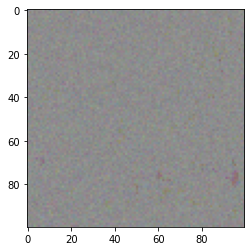

EPOCH 1


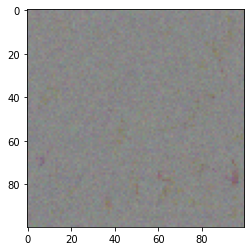

EPOCH 2


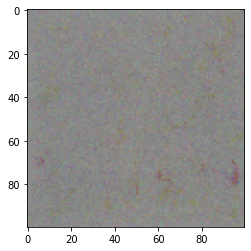

EPOCH 3


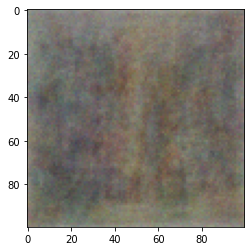

EPOCH 4


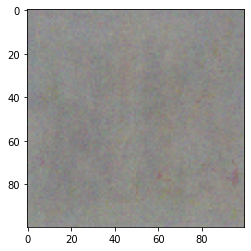

EPOCH 5


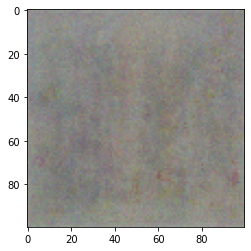

EPOCH 6


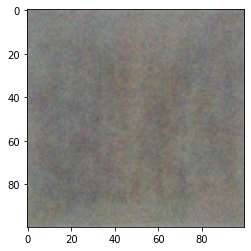

EPOCH 7


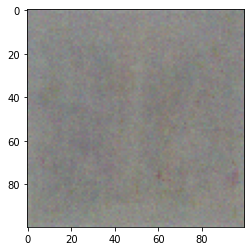

EPOCH 8


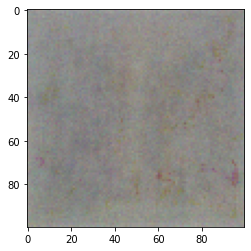

EPOCH 9


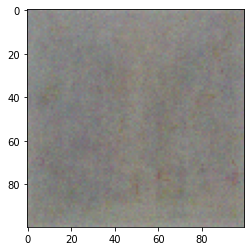

EPOCH 10


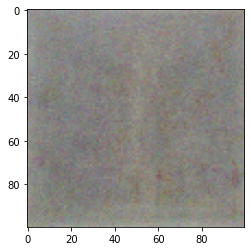

EPOCH 11


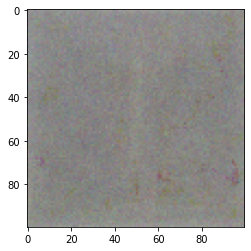

EPOCH 12


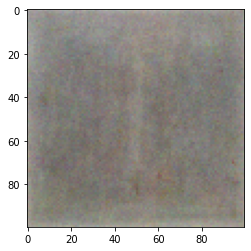

EPOCH 13


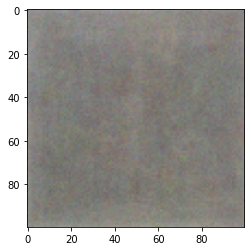

EPOCH 14


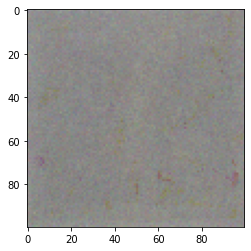

EPOCH 15


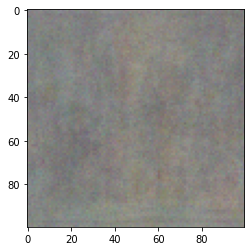

KeyboardInterrupt: ignored

In [ ]:
def train_bothIm(disc, gen, X_train_loader):
    optimizer_disc = optim.RMSprop(disc.parameters(), lr=0.0002)
    optimizer_gen = optim.RMSprop(gen.parameters(), lr=0.0002)
    EPOCHS = 200
    disc.train()
    gen.train()
    true_losses_disc = []
    false_losses_disc = []
    losses_gen = []

    for epoch in range(EPOCHS):
        print("EPOCH " + str(epoch))
        #for batch_idx, (X_batch, _) in enumerate(X_train_loader):
        for batch_idx, X_batch in enumerate(X_train_loader):
            b_size = X_batch[0].to(device).size(0)
            BATCH_SIZE = 5
            disc.train()
            gen.eval()
            optimizer_disc.zero_grad()
            var_X_batch_true = Variable(X_batch).float().to(device)
            output_true = disc(var_X_batch_true)
            loss_true = -torch.mean(output_true)
            loss_true.backward()

            noise = Variable(torch.rand(BATCH_SIZE, 100)).to(device)
            gen_output = gen(noise).detach()
            output_fake = disc(gen_output)
            loss_false_disc = torch.mean(output_fake)
            loss_false_disc.backward()
            optimizer_disc.step()

            #BATCH_SIZE = 10
            disc.eval()
            gen.train()
            optimizer_gen.zero_grad()
            noise = Variable(torch.rand(BATCH_SIZE, 100)).to(device)
            gen_output = gen(noise)
            output_fake = disc(gen_output)
            loss_false_gen = -torch.mean(output_fake)
            loss_false_gen.backward()
            optimizer_gen.step()

            for p in disc.parameters():
              p.data.clamp_(-0.01, 0.01)

            for p in gen.parameters():
              p.data.clamp_(-0.1, 0.1)

            if batch_idx % 100 == 0:
              gen.eval()
              #print("LOSS: Disc (true): " + str(loss_true.item()) + " Disc (fake): " + str(loss_false_disc.item()) + " Gen: " + str(loss_false_gen.item()))
              true_losses_disc.append(loss_true.item())
              false_losses_disc.append(loss_false_disc.item())
              losses_gen.append(loss_false_gen.item())
              pic = gen(Variable(torch.randn(BATCH_SIZE, 100)).to(device))
              pic = np.asarray(pic[0].detach().cpu().numpy())
              pic = np.moveaxis(pic, 0, -1)
              imshow(pic)
              plt.show()

    for i in range(10):
      print("LOSS: Disc (true): " + str(true_losses_disc[i]) + " Disc (fake): " + str(false_losses_disc[i]) + " Gen: " + str(losses_gen[i]))
    
    print()
    print()

    for i in range(10):
      print("LOSS: Disc (true): " + str(true_losses_disc[len(true_losses_disc)-10+i]) + " Disc (fake): " + str(false_losses_disc[len(true_losses_disc)-10+i]) + " Gen: " + str(losses_gen[len(true_losses_disc)-10+i]))
            


DIm = DiscriminatorIm6().to(device)
GIm = GeneratorIm2().to(device)
train_bothIm(DIm, GIm, train_loader_true)

In [ ]:
def evaluate_discIm(disc, gen, X_test_loader):
  disc.eval()
  gen.eval()
  with torch.no_grad():
    correct_real = 0
    for batch_idx, (X_batch, _) in enumerate(X_test_loader):
      var_X_batch_true = Variable(X_batch).float().to(device)
      output_true = disc(var_X_batch_true)
      pred_real = torch.sign(output_true)
      correct_real += int(torch.sum(pred_real==1))

      if batch_idx == 1:
        print(output_true.cpu().numpy())
        print(pred_real.cpu().numpy())

    print()
    
    correct_fake = 0
    for i in range(10000):
      torch.manual_seed(i)
      X_fake = gen(torch.rand(100).to(device))
      pred_fake = torch.sign(disc(X_fake))
      correct_fake += (1 if (pred_fake==-1) else 0)

    for i in range(10):
      torch.manual_seed(i)
      X_fake = gen(torch.rand(100).to(device))
      print(disc(X_fake).cpu().numpy())
      print(torch.sign(disc(X_fake)).cpu().numpy())
    print()
    print()

    print("Real Percentage Correct: " + str(100 * correct_real / 10000) + "%")
    print("Fake Percentage Correct: " + str(100 * correct_fake / 10000) + "%")

evaluate_discIm(DIm, GIm, test_loader_true)

In [ ]:
def evaluate_gen(gen):
  with torch.no_grad():
    gen.eval()
    for i in range(10):
      pic = gen(torch.rand(100).to(device))
      pic = np.asarray(pic[0].detach().cpu().numpy())
      pic = np.moveaxis(pic, 0, -1)
      imshow(pic)
      plt.show()

evaluate_gen(GIm)